<a href="https://colab.research.google.com/github/pj0620/google-colab-notebooks/blob/main/gptpet_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import cv2

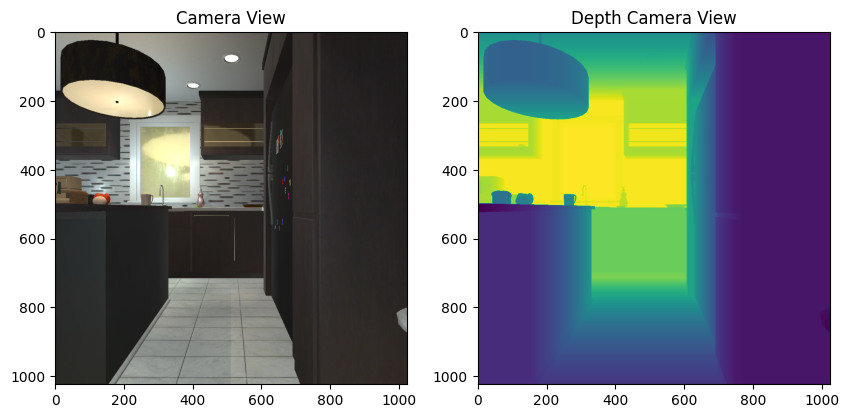

In [ ]:
image_arr = np.load('/content/drive/MyDrive/Colab Notebooks/image.npy')
depth_image_arr = np.load('/content/drive/MyDrive/Colab Notebooks/depth_image.npy')

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(image_arr)
ax1.set_title('Camera View')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(depth_image_arr)
ax2.set_title('Depth Camera View')

plt.show()

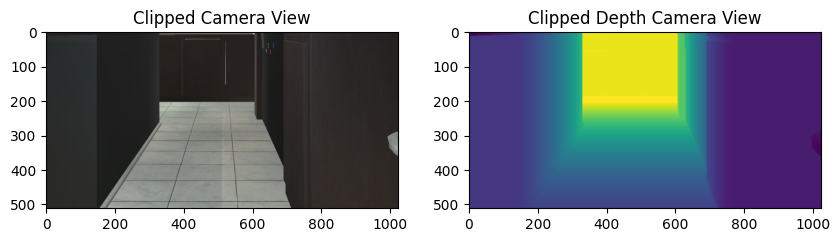

In [ ]:
top_percent = 0.5
bottom_percent = 1

height = image_arr.shape[0]
image_arr_clipped = image_arr[int(height*top_percent):int(height*bottom_percent), :]
depth_image_arr_clipped = depth_image_arr[int(height*top_percent):int(height*bottom_percent), :]

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(image_arr_clipped)
ax1.set_title('Clipped Camera View')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(depth_image_arr_clipped)
ax2.set_title('Clipped Depth Camera View')

plt.show()

# Blob Detection (Not Used)

In [ ]:
# Preprocessing
from sklearn import preprocessing as p

print(f'depth_image_arr_clipped: {depth_image_arr_clipped[:3, :5]} {(np.min(depth_image_arr_clipped), np.max(depth_image_arr_clipped))=}')

min_max_scaler = p.MinMaxScaler()
depth_img_scaled = 255 * min_max_scaler.fit_transform(depth_image_arr_clipped)
depth_img_scaled = depth_img_scaled.astype(np.uint8)

print(f'depth_img_scaled: {depth_img_scaled[:3, :5]} {(np.min(depth_img_scaled), np.max(depth_img_scaled))=}')

depth_image_arr_clipped: [[0.82014364 0.82174873 0.8233601  0.8249819  0.8266059 ]
 [0.82014364 0.82174873 0.8233601  0.8249819  0.8266059 ]
 [0.82014364 0.82174873 0.8233601  0.8249819  0.8266059 ]] (np.min(depth_image_arr_clipped), np.max(depth_image_arr_clipped))=(0.82014364, 3.2083006)
depth_img_scaled: [[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]] (np.min(depth_img_scaled), np.max(depth_img_scaled))=(0, 255)


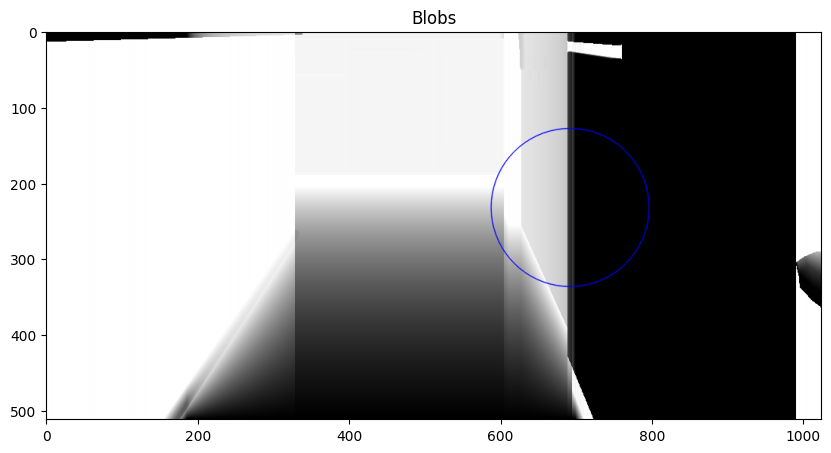

In [ ]:
# Set up the detector with default parameters.
params = cv2.SimpleBlobDetector_Params()
params.filterByArea = False
params.filterByInertia = False
params.filterByConvexity = False
detector = cv2.SimpleBlobDetector_create(params)

# Detect blobs.
keypoints = detector.detect(depth_img_scaled)

# Draw detected blobs as red circles.
# cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ensures the size of the circle corresponds to the size of blob
im_with_keypoints = cv2.drawKeypoints(depth_img_scaled, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Show keypoints
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.imshow(im_with_keypoints)
ax1.set_title('Blobs')
cv2.waitKey(0)

plt.show()

In [ ]:
!cat /var/log/colab-jupyter.log

cat: /var/log/colab-jupyter.log: No such file or directory


# Horizontal Averages with Thresholding

labeled_img[:, section[0]:section[1], 0]=array([[156, 155, 156, ...,  60,  62,  62],
       [157, 154, 155, ...,  60,  62,  61],
       [156, 155, 155, ...,  60,  63,  62],
       ...,
       [143, 142, 144, ..., 150, 155, 155],
       [144, 144, 146, ..., 150, 158, 159],
       [145, 145, 147, ..., 149, 153, 157]], dtype=uint8)


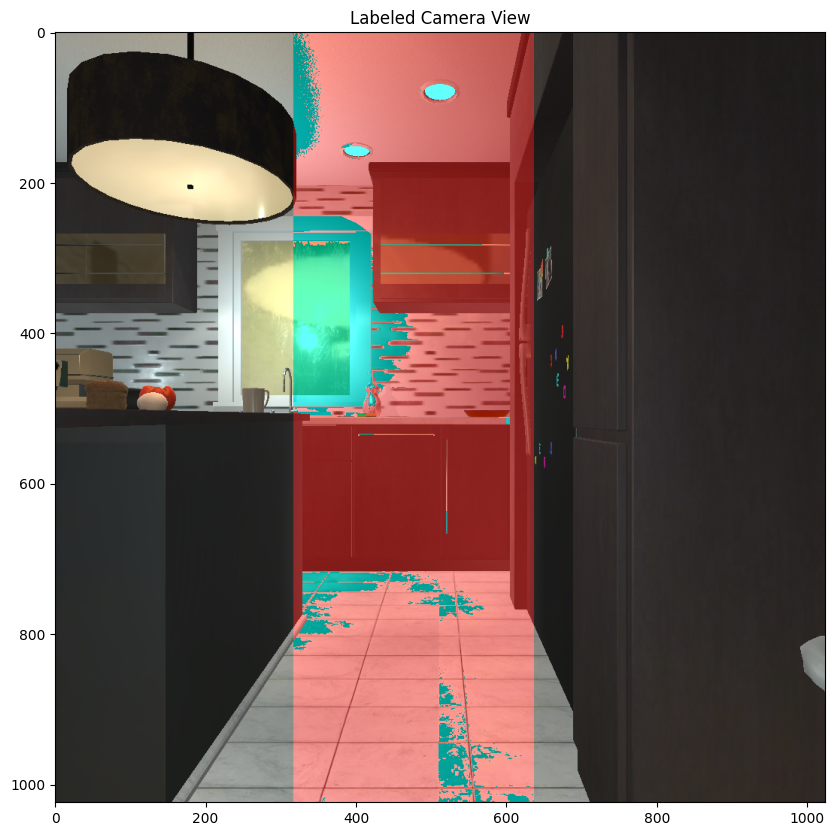

In [ ]:
n_cols = depth_image_arr_clipped.shape[0]
row_avgs = np.sum(depth_image_arr_clipped, axis = 0) / n_cols

threshold = 2

sections = []
centers_horz = []
in_section = False

# x_0 * avg_0 + x_1 * avg_1 + ...
weighted_loc_sum = 0

# avg_0 + avg_1 + ...
weight_sum = 0
for k in range(row_avgs.shape[0]):
  avg = row_avgs[k]
  if avg > threshold:
    weighted_loc_sum += k * avg
    weight_sum += avg
    if in_section:
      sections[-1][1] = k
      centers_horz[-1] = weighted_loc_sum / weight_sum
    else:
      sections.append([k, -1])
      centers_horz.append(k)
      in_section = True
  else:
    in_section = False

labeled_img = np.copy(image_arr)
for section in sections:
  print(f"{labeled_img[:, section[0]:section[1], 0]=}")
  labeled_img[:, section[0]:section[1], 0] += 100

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.imshow(labeled_img)
ax1.set_title('Labeled Camera View')

plt.show()

In [ ]:
depth_image_arr_clipped.shape

(512, 1024)

In [ ]:
np.sum(depth_image_arr_clipped, axis = 0).shape

(1024,)

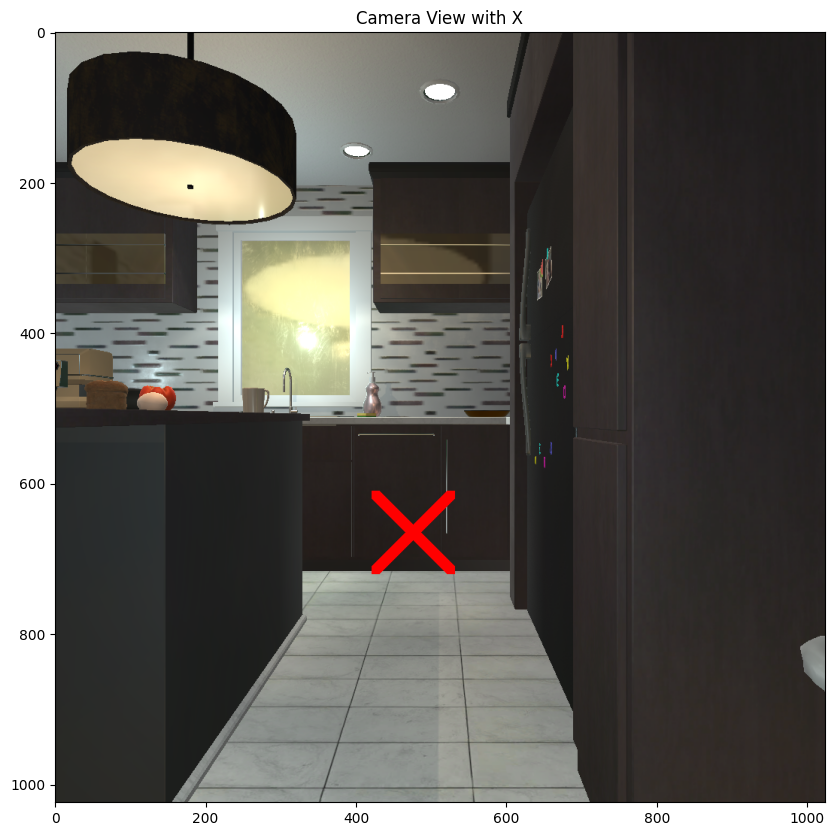

In [ ]:
def draw_line(img, start, end, color, thickness):
    """Draw a line on an image using Bresenham's algorithm."""
    x0, y0 = start
    x1, y1 = end
    dx = abs(x1 - x0)
    dy = -abs(y1 - y0)
    sx = 1 if x0 < x1 else -1
    sy = 1 if y0 < y1 else -1
    err = dx + dy

    while True:
        for t in range(-thickness // 2, thickness // 2 + 1):
            for u in range(-thickness // 2, thickness // 2 + 1):
                if 0 <= x0 + u < img.shape[1] and 0 <= y0 + t < img.shape[0]:
                    img[int(y0 + t), int(x0 + u)] = np.array(color)
        if x0 == x1 and y0 == y1:
            break
        e2 = 2 * err
        if e2 >= dy:
            err += dy
            x0 += sx
        if e2 <= dx:
            err += dx
            y0 += sy

def draw_x(img, center, size, thickness, color):
    """Draw an X at a specific location on the image."""
    cx, cy = center
    half_size = size // 2

    # Calculate end points for both lines of the X
    start1 = (cx - half_size, cy - half_size)
    end1 = (cx + half_size, cy + half_size)
    start2 = (cx - half_size, cy + half_size)
    end2 = (cx + half_size, cy - half_size)

    # Draw both lines
    draw_line(img, start1, end1, color, thickness)
    draw_line(img, start2, end2, color, thickness)


height_percent = 0.65

height = image_arr.shape[0]

centers = [
    (cx, height_percent * height)
    for cx in centers_horz
]

labeled_img = np.copy(image_arr)
for center in centers:
  draw_x(labeled_img, center, size=100, thickness=10, color=[255, 0, 0])

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.imshow(labeled_img)
ax1.set_title('Camera View with X')

plt.show()

# Objects

This section will overvide how gptpet will identify and localize objects

In [ ]:
import matplotlib.pyplot as plt
import base64
from io import BytesIO

%pip install openai
from openai import OpenAI
from google.colab import userdata

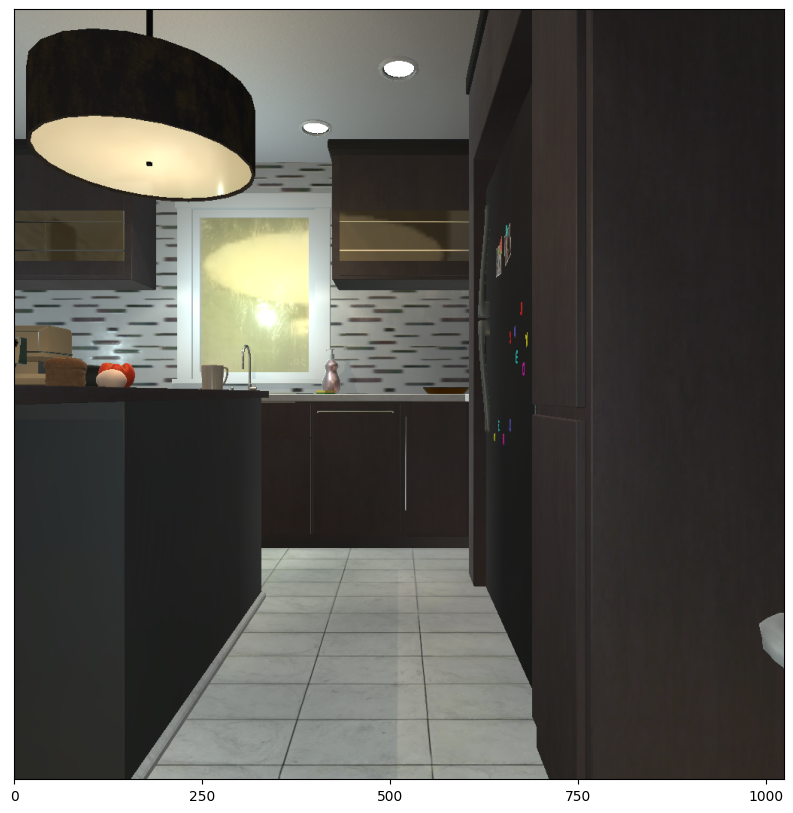

iVBORw0KGgoAAAANSUhEUgAAAoAAAAHgCAYAAAA10dzkAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAIyUlEQVR4nO3WMQEAIAzAMMC/5+ECjiYKenbPzCwAADLO7wAAAN4ygAAAMQYQACDGAAIAxBhAAIAYAwgAEGMAAQBiDCAAQIwBBACIMYAAADEGEAAgxgACAMQYQACAGAMIABBjAAEAYgwgAECMAQQAiDGAAAAxBhAAIMYAAgDEGEAAgBgDCAAQYwABAGIMIABAjAEEAIgxgAAAMQYQACDGAAIAxBhAAIAYAwgAEGMAAQBiDCAAQIwBBACIMYAAADEGEAAgxgACAMQYQACAGAMIABBjAAEAYgwgAECMAQQAiDGAAAAxBhAAIMYAAgDEGEAAgBgDCAAQYwABAGIMIABAjAEEAIgxgAAAMQYQACDGAAIAxBhAAIAYAwgAEGMAAQBiDCAAQIwBBACIMYAAADEGEAAgxgACAMQYQACAGAMIABBjAAEAYgwgAECMAQQAiDGAAAAxBhAAIMYAAgDEGEAAgBgDCAAQYwABAGIMIABAjAEEAIgxgAAAMQYQACDGAAIAxBhAAIAYAwgAEGMAAQBiDCAAQIwBBACIMYAAADEGEAAgxgACAMQYQACAGAMIABBjAAEAYgwgAECMAQQAiDGAAAAxBhAAIMYAAgDEGEAAgBgDCAAQYwABAGIMIABAjAEEAIgxgAAAMQYQACDGAAIAxBhAAIAYAwgAEGMAAQBiDCAAQIwBBACIMYAAADEGEAAgxgACAMQYQACAGAMIABBjAAEAYgwgAECMAQQAiDGAAAAxBhAAIMYAAgDEGEAAgBgDCAAQYwABAGIMIABAjAEEAIgxgAAAMQYQACDGAAIAxBhAAIAYAwgAEGMAAQBiDCAA

<Figure size 640x480 with 0 Axes>

In [ ]:
image_arr_with_scale = np.copy(image_arr)


fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.set(yticklabels=[])
ax1.set(ylabel=None)  # remove the y-axis label
ax1.tick_params(left=False)
ax1.locator_params(nbins=5)
ax1.imshow(image_arr_with_scale)

plt.show()

buf = BytesIO()
plt.savefig(buf, format='png')
buf.seek(0)
image_base64 = base64.b64encode(buf.read()).decode('utf-8')
print(image_base64)

### Let's find the best number of ticks

400
375
350
400
350
350
350
350
350
400
Ys=[400, 375, 350, 400, 350, 350, 350, 350, 350, 400]


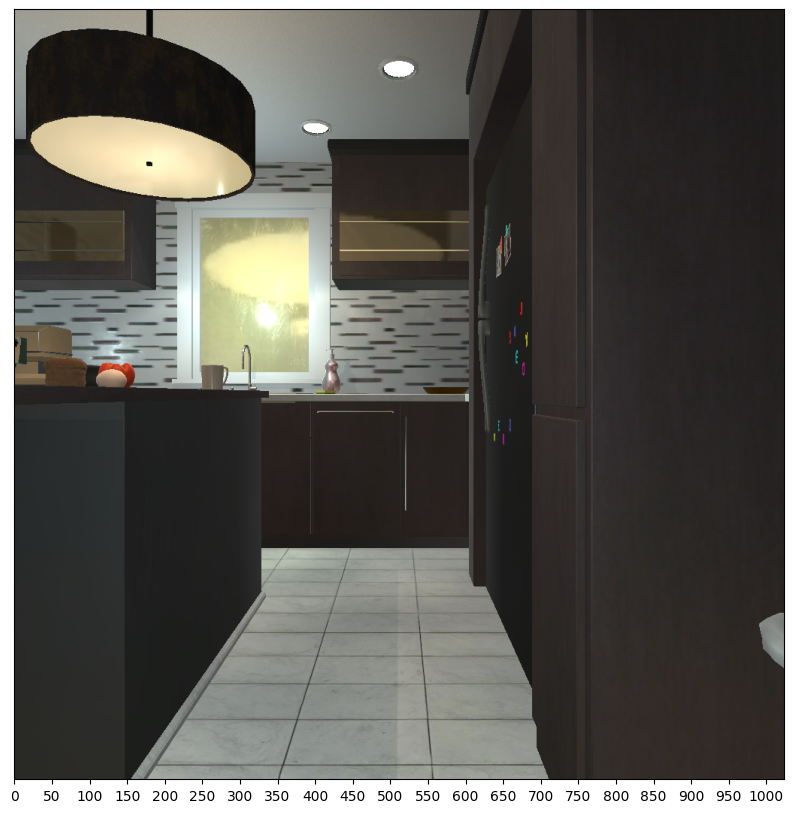

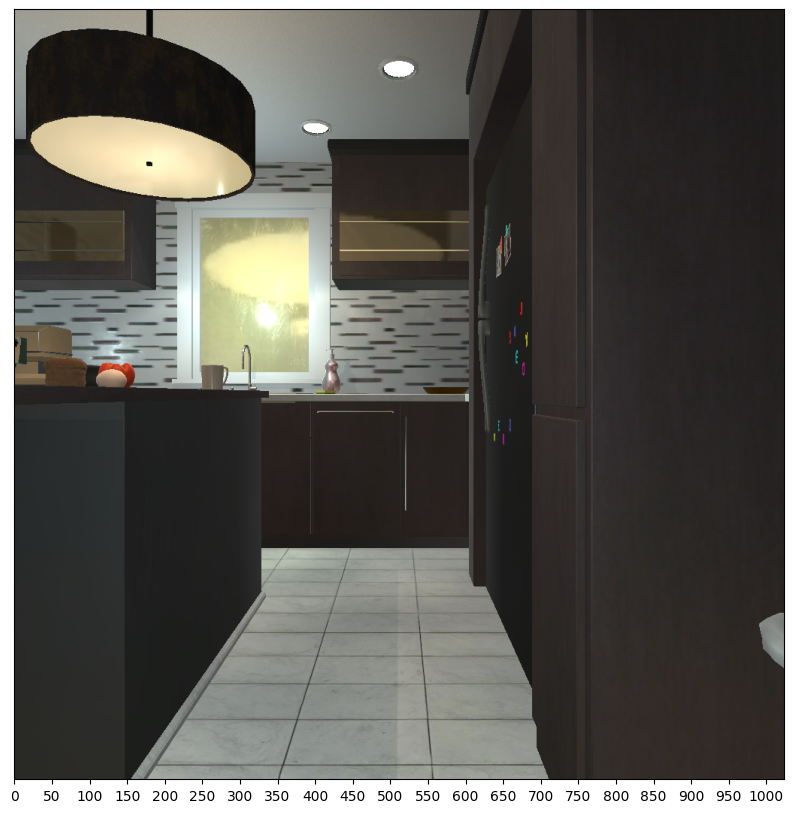

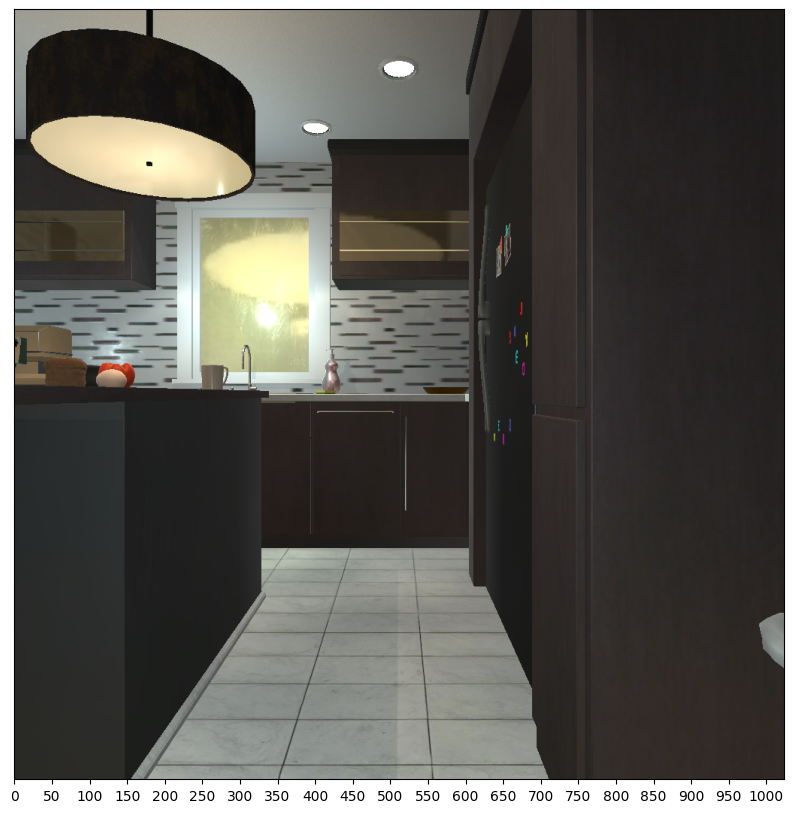

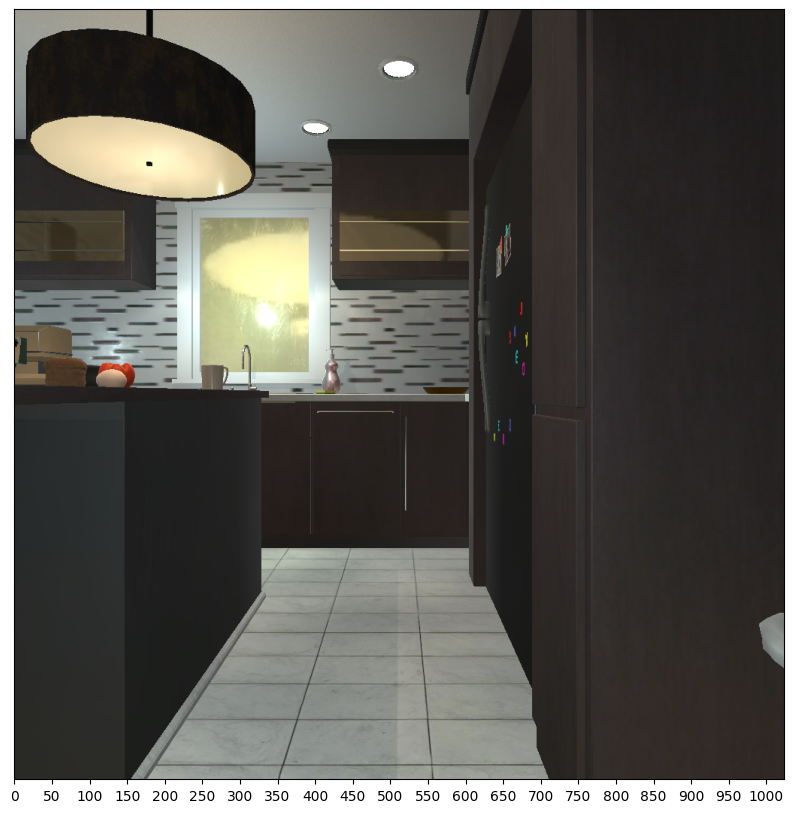

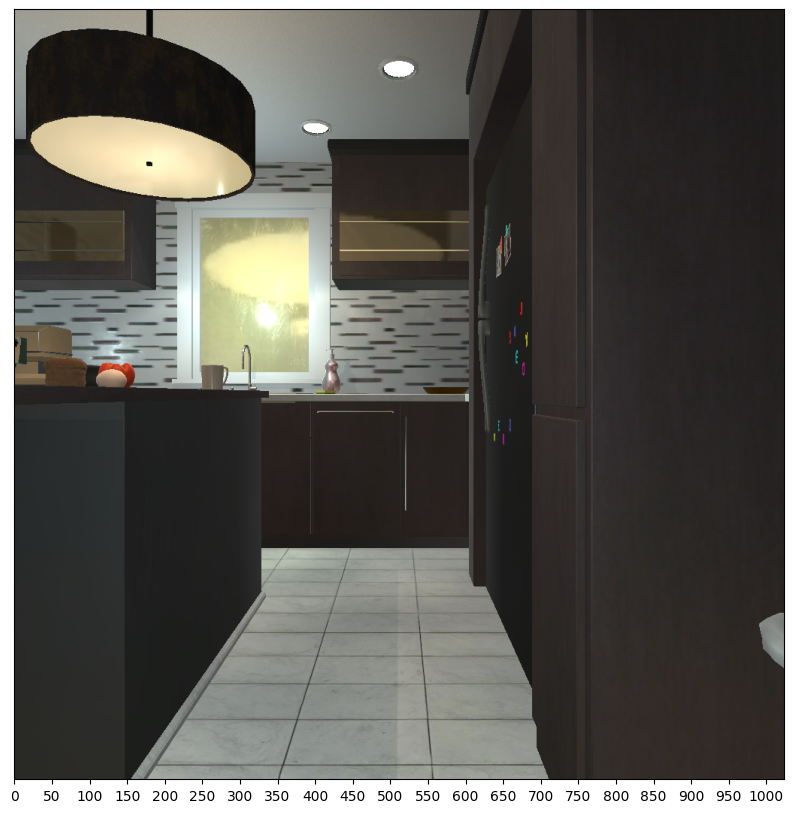

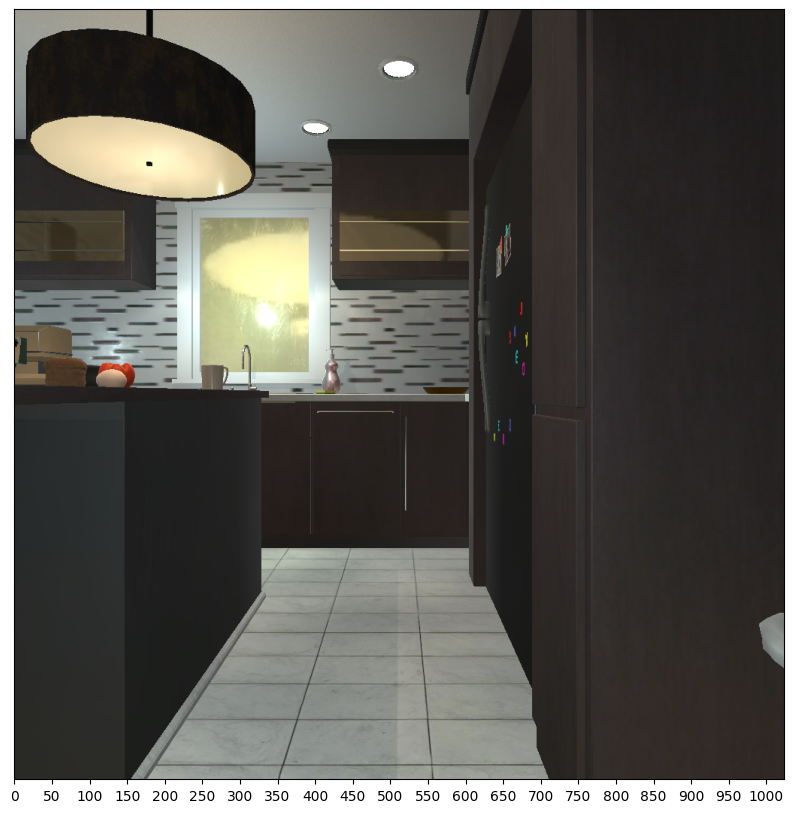

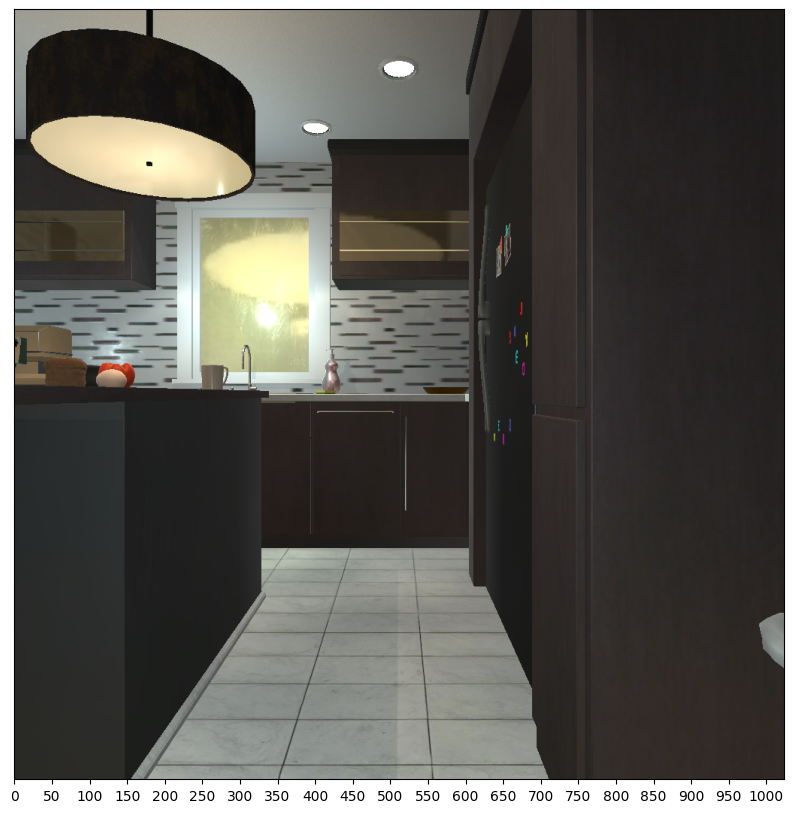

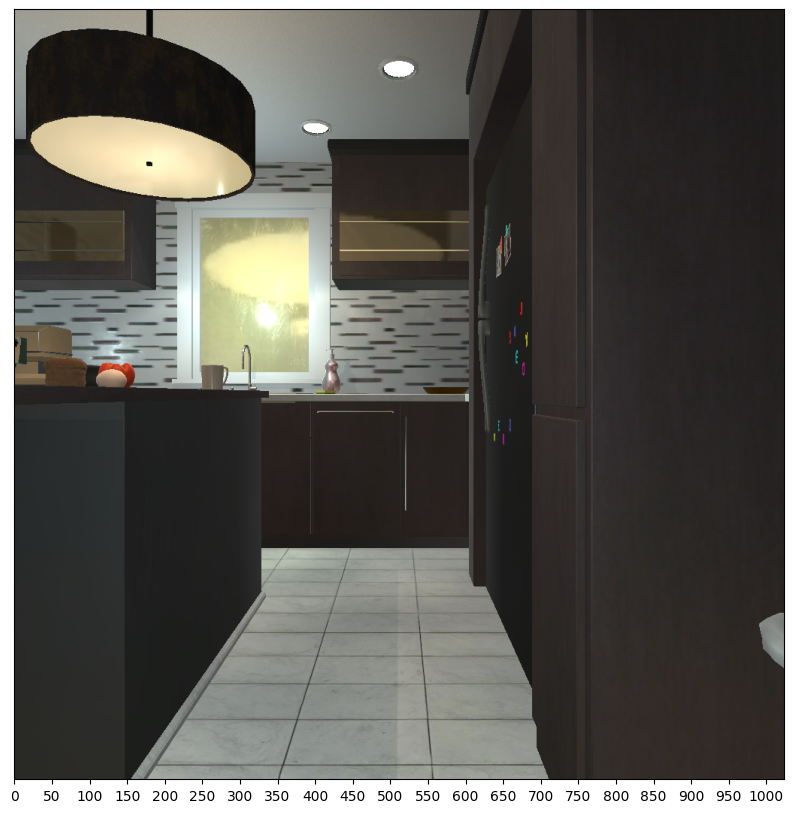

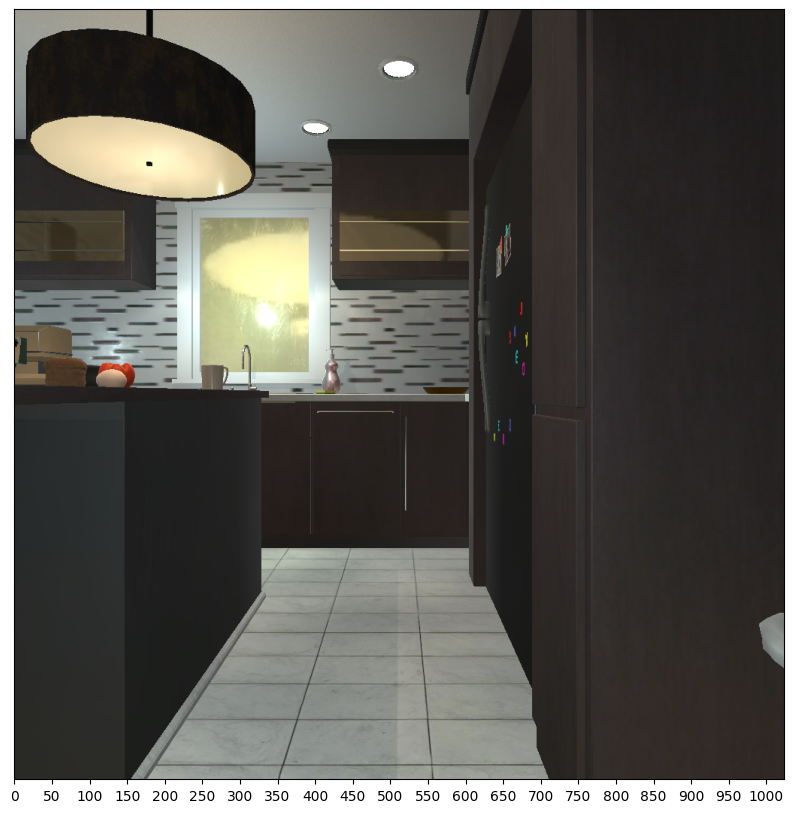

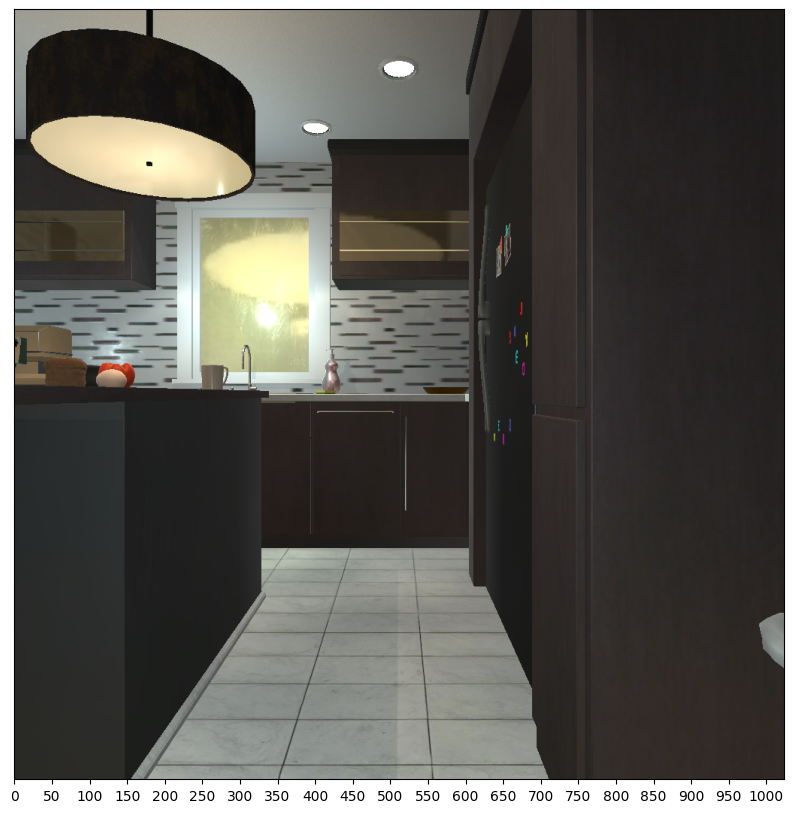

In [ ]:
client = OpenAI(
    api_key=userdata.get('OPENAI_API_KEY')
)

def get_image(bins: int) -> str:
  image_arr_with_scale = np.copy(image_arr)

  fig = plt.figure(figsize=(10,10))
  ax1 = fig.add_subplot(1,1,1)
  ax1.set(yticklabels=[])
  ax1.set(ylabel=None)  # remove the y-axis label
  ax1.tick_params(left=False)
  ax1.locator_params(nbins=30)
  ax1.imshow(image_arr_with_scale)

  buf = BytesIO()
  plt.savefig(buf, format='png')
  buf.seek(0)
  return base64.b64encode(buf.read()).decode('utf-8')

Xs = range(1, 50, 5)
Ys = []
for bins in range(1, 50, 5):
# for bins in [10]:
  base64_image = get_image(bins)
  response = client.chat.completions.create(
  model="gpt-4-vision-preview",
  messages=[
      {
        "role": "user",
        "content": [
          {"type": "text", "text": "Give me the horizontal location of the soap dispensor in this image using the scale on the bottom of the image. Only respond with the number and no text besides the number."},
          {
            "type": "image_url",
            "image_url": {
              "url": f"data:image/jpeg;base64,{base64_image}"
            },
          },
        ],
      }
    ],
    max_tokens=300,
  )
  resp = int(response.choices[0].message.content)
  print(resp)
  Ys.append(resp)

print(f"{Ys=}")


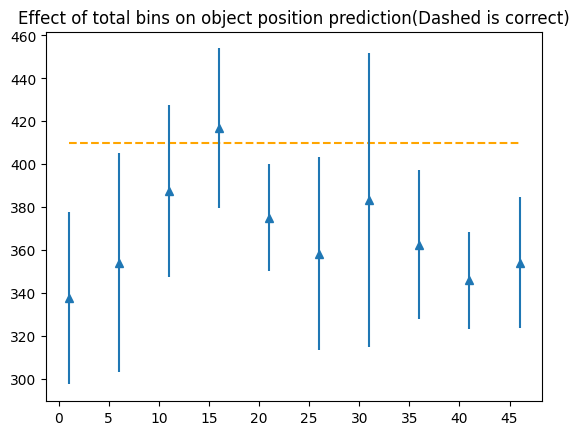

In [ ]:
Xs = range(1, 50, 5)
combined = np.array([
[300, 300, 450, 350, 350, 300, 500, 375, 350, 300],
[350, 350, 350, 450, 350, 350, 450, 350, 300, 375],
[350, 350, 400, 400, 400, 450, 350, 400, 375, 350],
[350, 300, 350, 450, 400, 350, 350, 300, 350, 350],
[275, 450, 425, 450, 400, 350, 300, 400, 350, 350],
[400, 375, 350, 400, 350, 350, 350, 350, 350, 400]
])
avgs = np.average(combined, axis=0)
errs = np.std(combined, axis=0)
Correct = [410] * len(Ys)
plt.locator_params(nbins=10)
plt.plot(Xs, Correct, linestyle='--', color='orange')
plt.errorbar(Xs, avgs, errs, linestyle='None', marker='^')
plt.title('Effect of total bins on object position prediction(Dashed is correct)')
plt.show()


### Low resolution mode


300
500
450
500
500
250
650
300
500
Ys=[300, 500, 450, 500, 500, 250, 650, 300, 500]


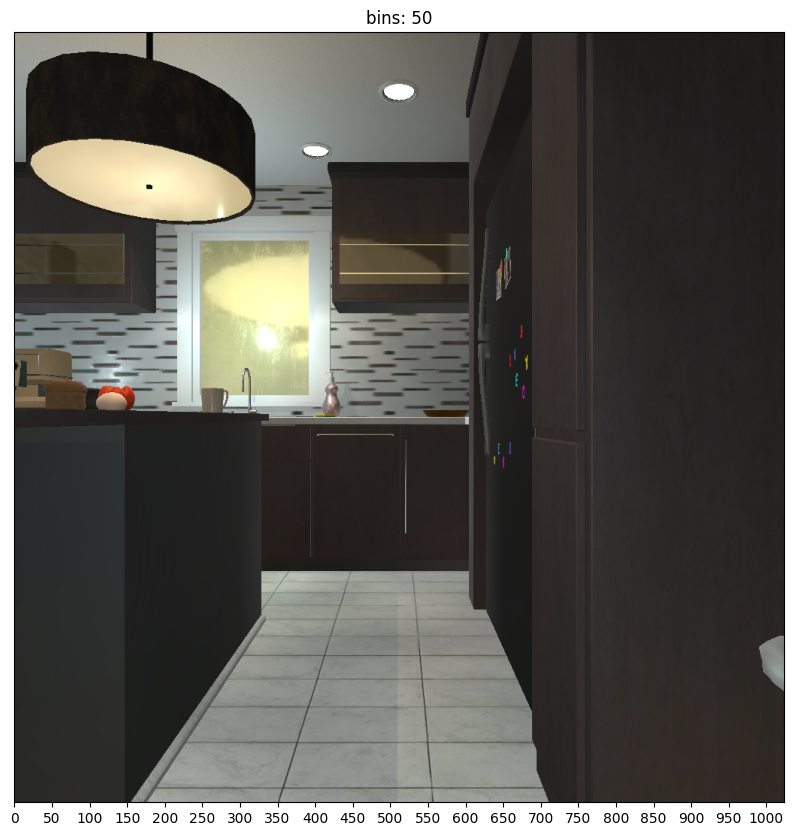

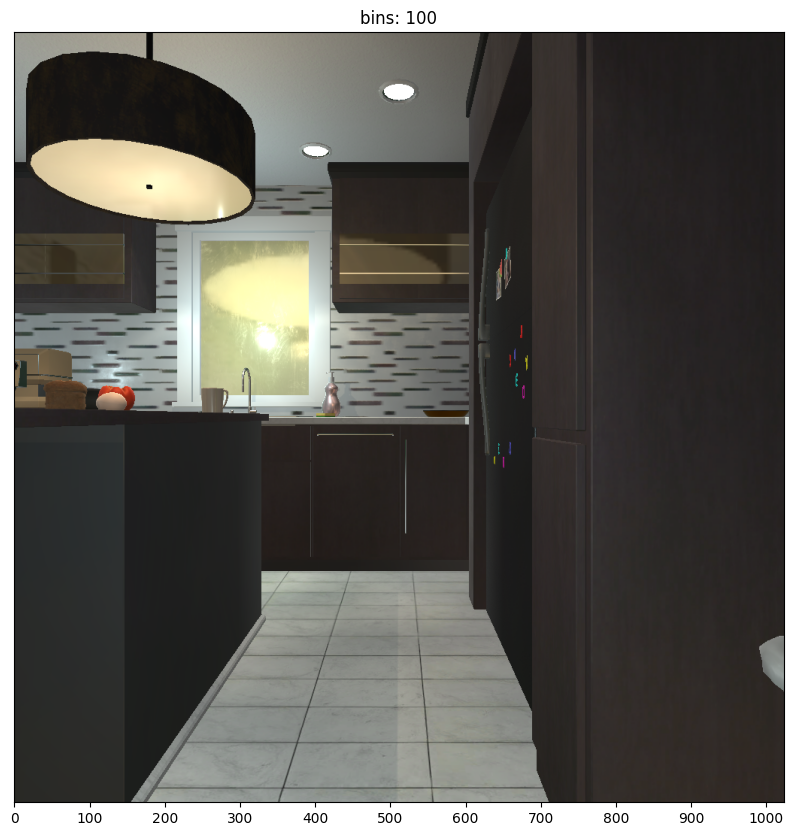

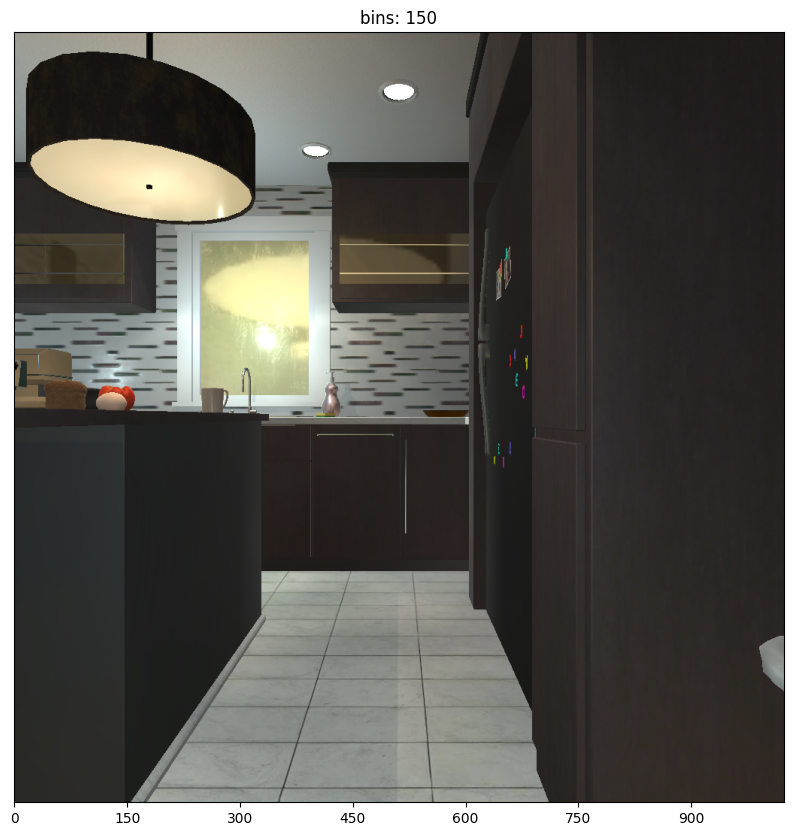

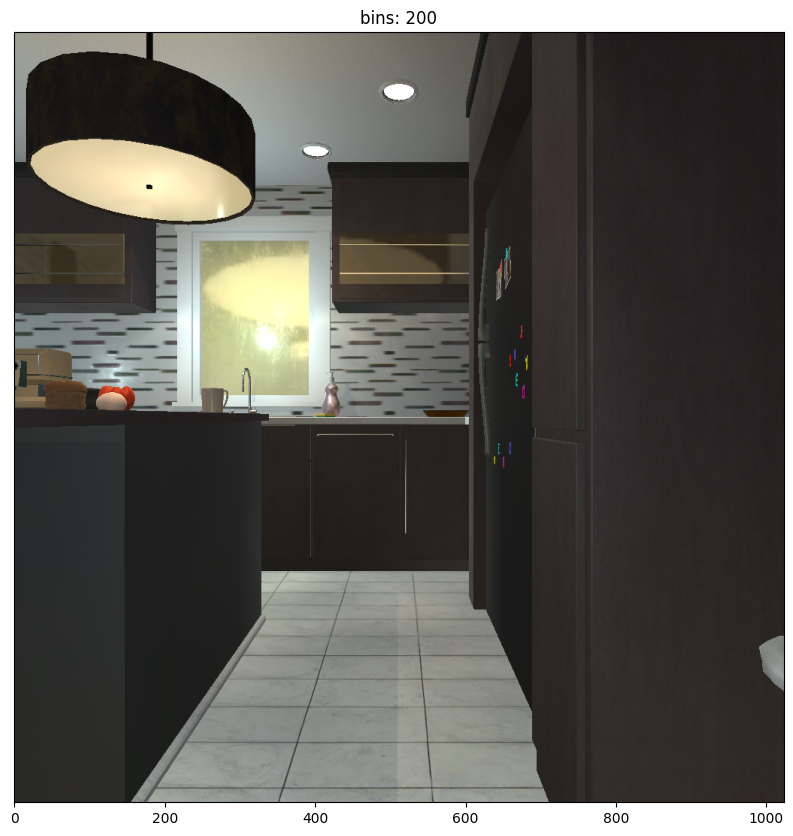

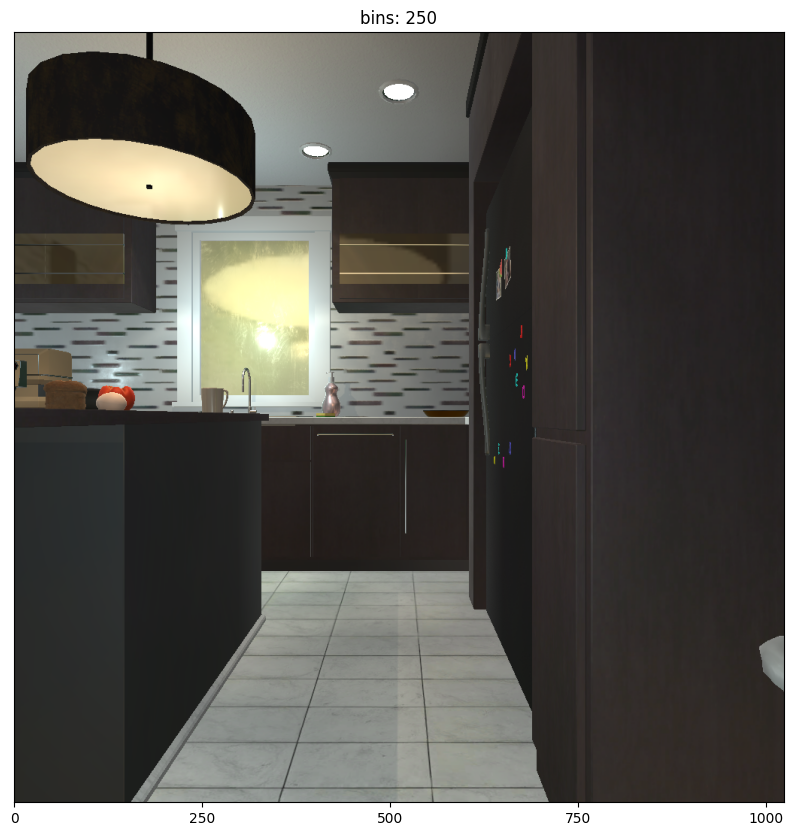

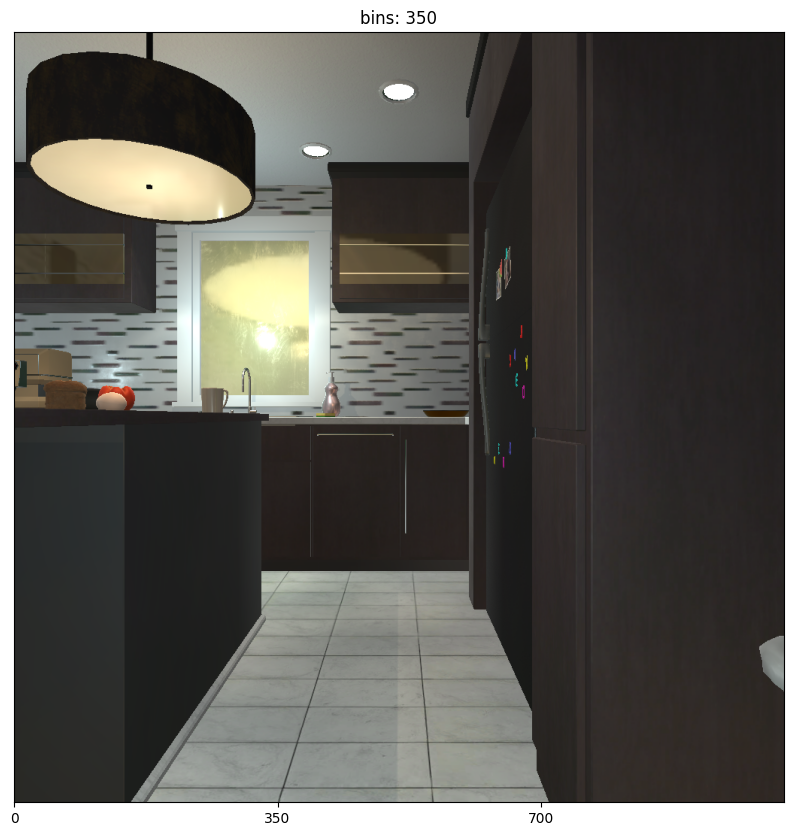

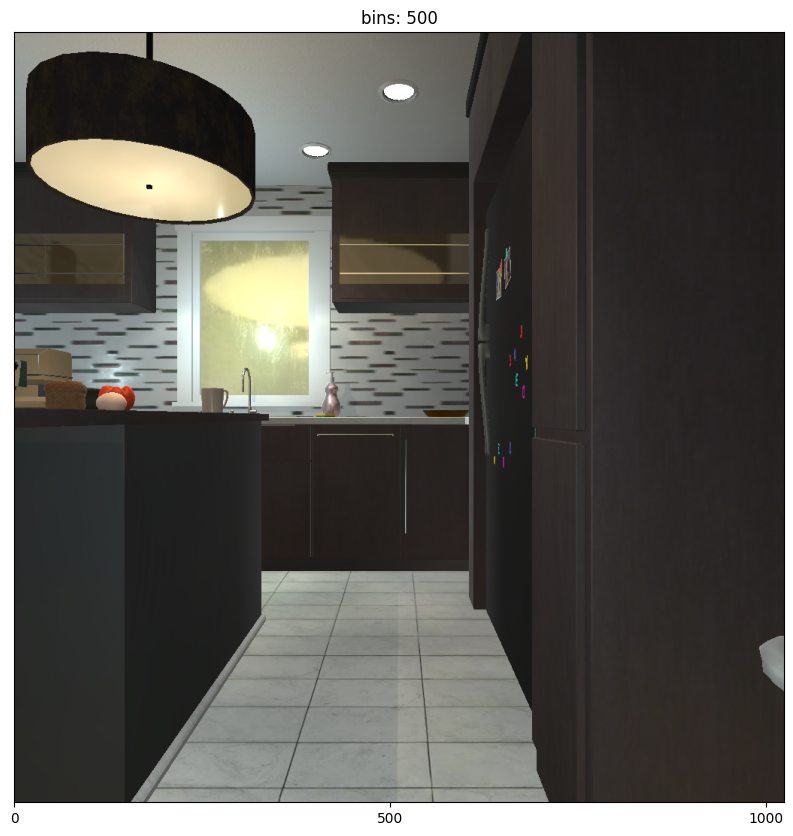

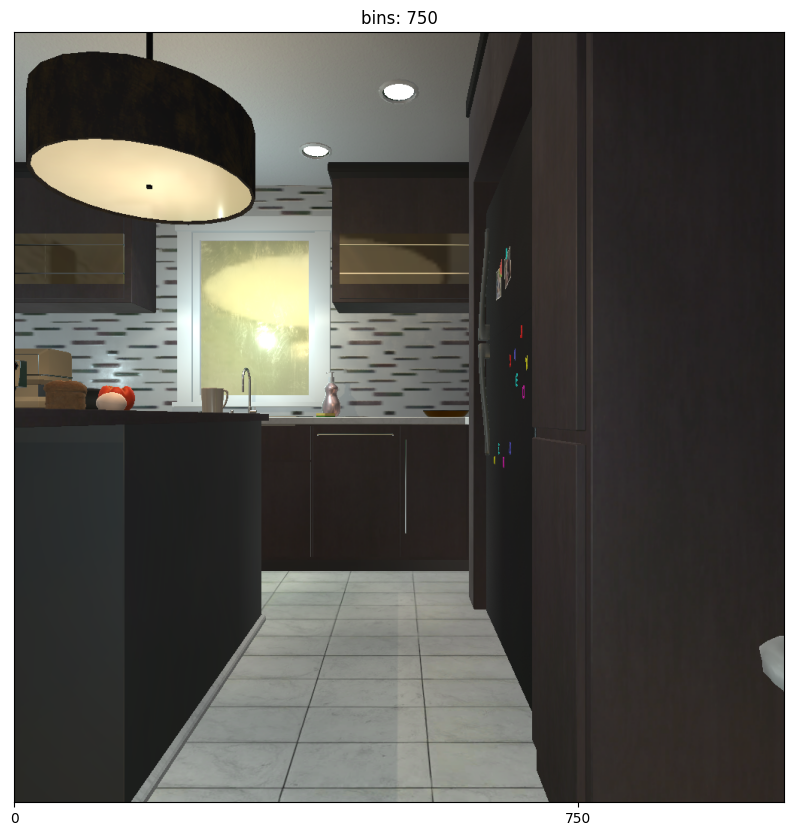

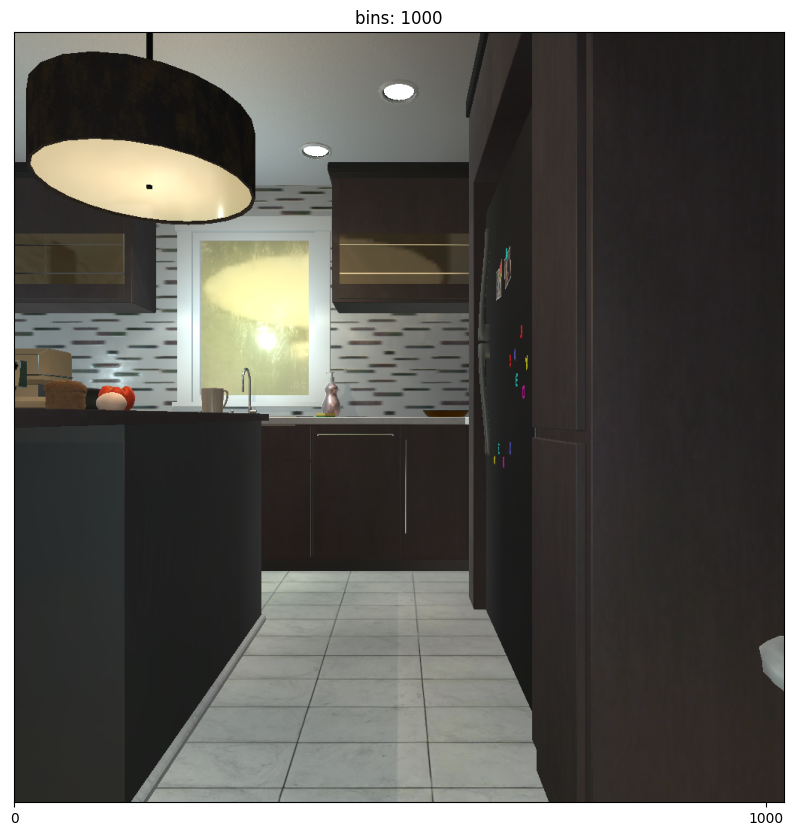

In [ ]:
client = OpenAI(
    api_key=userdata.get('OPENAI_API_KEY')
)

def get_image(step_size: int) -> str:
  image_arr_with_scale = np.copy(image_arr)

  fig = plt.figure(figsize=(10,10))
  ax1 = fig.add_subplot(1,1,1)
  ax1.set(yticklabels=[])
  ax1.set(ylabel=None)  # remove the y-axis label
  ax1.tick_params(left=False)
  ax1.set_xticks(np.arange(image_arr_with_scale.shape[0], step=step_size))
  ax1.set_title(f'bins: {bins}')
  ax1.imshow(image_arr_with_scale)

  buf = BytesIO()
  fig.savefig(buf, format='png')
  buf.seek(0)
  return base64.b64encode(buf.read()).decode('utf-8')
Xs = [50, 100, 150, 200, 250, 350, 500, 750, 1000]
Ys = []
for bins in Xs:
  base64_image = get_image(bins)
  response = client.chat.completions.create(
  model="gpt-4-vision-preview",
  messages=[
      {
        "role": "system",
        "content": [
          {"type": "text", "text": "Give me the horizontal location of the soap " +
           "dispensor in this image using the scale on the bottom of the image. Only respond with the number and no text besides the number. "},
        ]
      },
      {
        "role": "user",
        "content": [
          {
              "type": "text",
              "text": "heres the image"
          },
          {
            "type": "image_url",
            "image_url": {
              "url": f"data:image/jpeg;base64,{base64_image}",
              "detail": "high"
            },
          },
        ],
      }
    ],
    max_tokens=300,
  )
  try:
    resp = int(response.choices[0].message.content)
  except:
    resp = -1
  print(resp)
  Ys.append(resp)

print(f"{Ys=}")


combined.shape=(5, 9) Xs=[50, 100, 150, 200, 250, 350, 500, 750, 1000]


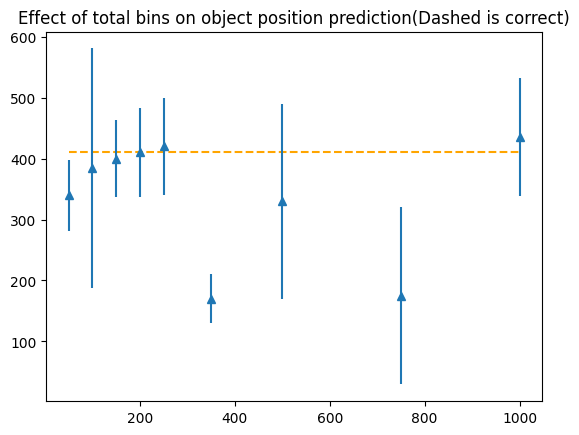

In [ ]:
combined = np.array([
[450, 500, 450, 500, 325, 150, 250,  -1, 500],
[350, 400, 350, 350, 450, 150, 250, 250, 425],
[300, 520, 300, 350, 500, 150, 250, 325, 500],
[300,  -1, 450, 350, 325, 150, 250,  -1, 250],
[300, 500, 450, 500, 500, 250, 650, 300, 500]
])
avgs = np.average(combined, axis=0)
errs = np.std(combined, axis=0)
Correct = [410] * len(Xs)
plt.locator_params(nbins=10)
print(f'{combined.shape=} {Xs=}')
plt.plot(Xs, Correct, linestyle='--', color='orange')
plt.errorbar(Xs, avgs, errs, linestyle='None', marker='^')
plt.title('Effect of total bins on object position prediction(Dashed is correct)')
plt.show()


iVBORw0KGgoAAAANSUhEUgAAA+gAAAPoCAYAAABNo9TkAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAEAAElEQVR4nOz9ebB1WVUniv7GXPvLzC+TbCATTBJSodC6ZUkpzwZKr4o3VETeu3oNm3dvSRk+tYhXYVNRVcZTK55d3DL8wyjjqlH6rpbPBrFE0RK7KrWu+mxAES8oQpJIAZpkIp2Q3dedveZ4f4x2rrX2OedLEvKI4wdfnr3XXmuu2c/xG2PMMYmZGYVCoVAoFAqFQqFQKBQeU7THOgOFQqFQKBQKhUKhUCgUiqAXCoVCoVAoFAqFQqFwJlAEvVAoFAqFQqFQKBQKhTOAIuiFQqFQKBQKhUKhUCicARRBLxQKhUKhUCgUCoVC4QygCHqhUCgUCoVCoVAoFApnAEXQC4VCoVAoFAqFQqFQOAMogl4oFAqFQqFQKBQKhcIZQBH0QqFQKBQKhUKhUCgUzgCKoBcKhUKhUCgUCoVCoXAGUAS9UCgUCoVCoVAoFAqFM4Ai6IVCoVAoFAqFQqFQKJwBFEEvFAqFQqFQKBQKhULhDKAIeqFQKBQKhUKhUCgUCmcARdALhUKhUCgUCoVCoVA4AyiCXigUCoVCoVAoFAqFwhlAEfRCoVAoFAqFQqFQKBTOAIqgFwqFQqFQKBQKhUKhcAZQBL1QKBQKhUKhUCgUCoUzgCLohUKhUCgUCoVCoVAonAEUQS8UCoVCoVAoFAqFQuEMoAh6oVAoFAqFQqFQKBQKZwBF0AuFQqFQKBQKhUKhUDgDKIJeKBQKhUKhUCgUCoXCGUAR9EKhUCgUCoVCoVAoFM4AiqAXCoVCoVAoFAqFQqFwBlAEvVAoFAqFQqFQKBQKhTOAIuiFQqFQKBQKhUKhUCicARRBLxQKhUKhUCgU

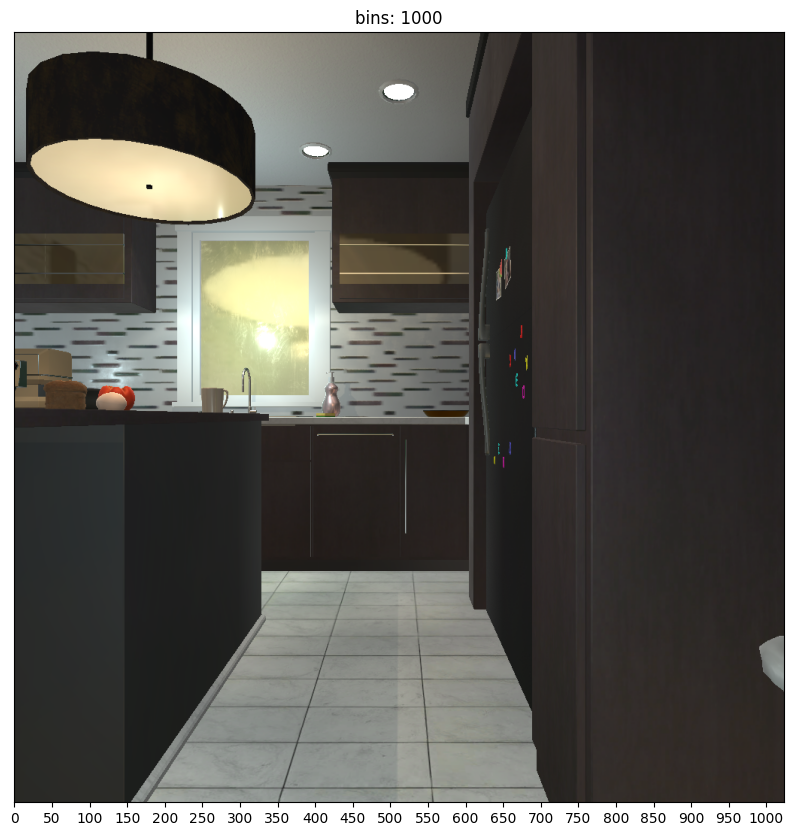

In [ ]:
image_arr_with_scale = np.copy(image_arr)

steps = [450, 500, 450, 500, 325, 150, 250, -1, 500]

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.set(yticklabels=[])
ax1.set(ylabel=None)  # remove the y-axis label
ax1.tick_params(left=False)
ax1.set_xticks(np.arange(image_arr_with_scale.shape[0], step=50))
ax1.set_title(f'bins: {bins}')
ax1.imshow(image_arr_with_scale)

buf = BytesIO()
plt.savefig(buf, format='png')
buf.seek(0)
print(base64.b64encode(buf.read()).decode('utf-8'))
# plt.show()

# Real Data

In [ ]:
!pip install imageio
import base64
import io
from dataclasses import dataclass
from io import BytesIO
from PIL import Image
from matplotlib import pyplot as plt
import imageio
import numpy as np

<ipython-input-11-a14ae909bd1e>:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  depth_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/depth.png')
<ipython-input-11-a14ae909bd1e>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  camera_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/camera.png')


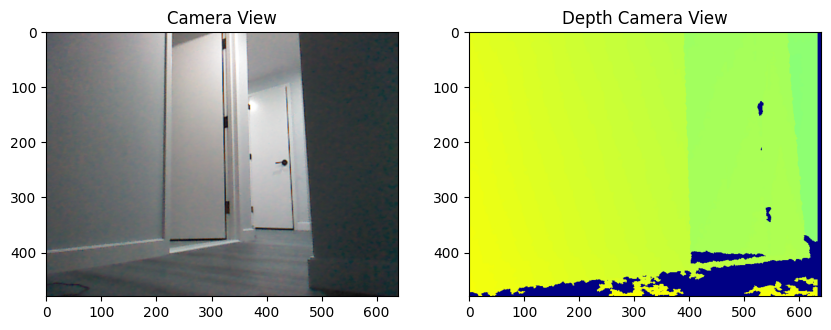

In [ ]:

def base64_to_arr(enc_img):
  base64_decoded = base64.b64decode(enc_img)

  image = Image.open(io.BytesIO(base64_decoded))
  return np.array(image)

depth_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/depth.png')
camera_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/camera.png')

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(camera_arr)
ax1.set_title('Camera View')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(depth_arr)
ax2.set_title('Depth Camera View')

plt.show()


depth_image_arr_clipped.shape=(192, 640, 3) depth_image_arr_clipped min=0 max=255
[  0   0 132]


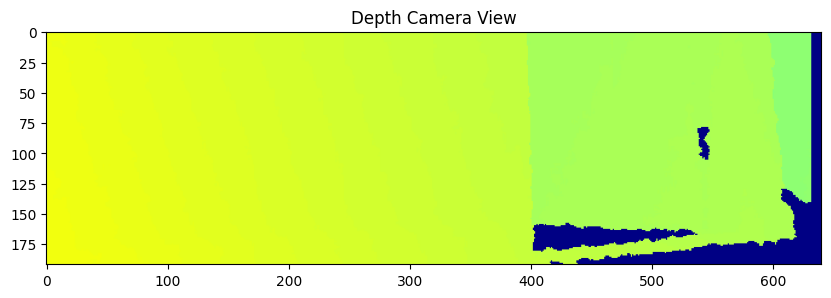

In [ ]:
image_height = depth_arr.shape[0]
top_percent = 0.5
bottom_percent = 0.9
depth_image_arr_clipped = depth_arr[int(image_height * top_percent):int(image_height * bottom_percent), :]

print(f'depth_image_arr_clipped.shape={depth_image_arr_clipped.shape} depth_image_arr_clipped min={depth_image_arr_clipped.min()} max={depth_image_arr_clipped.max()}')

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.imshow(depth_image_arr_clipped)
ax1.set_title('Depth Camera View')

print(depth_image_arr_clipped[-1][-1])

plt.show()

In [ ]:


FIELD_OF_VIEW = 70

@dataclass
class PhysicalPassagewayInfo:
  color: str
  turn_degrees: float


def draw_line(img, start, end, color, thickness):
  """Draw a line on an image using Bresenham's algorithm."""
  x0, y0 = start
  x1, y1 = end
  dx = abs(x1 - x0)
  dy = -abs(y1 - y0)
  sx = 1 if x0 < x1 else -1
  sy = 1 if y0 < y1 else -1
  err = dx + dy

  while True:
    for t in range(-thickness // 2, thickness // 2 + 1):
      for u in range(-thickness // 2, thickness // 2 + 1):
        if 0 <= x0 + u < img.shape[1] and 0 <= y0 + t < img.shape[0]:
          img[int(y0 + t), int(x0 + u)] = np.array(color)
    if x0 == x1 and y0 == y1:
      break
    e2 = 2 * err
    if e2 >= dy:
      err += dy
      x0 += sx
    if e2 <= dx:
      err += dx
      y0 += sy


def draw_x(img, center, size, thickness, color):
  """Draw an X at a specific location on the image."""
  cx, cy = center
  half_size = size // 2

  # Calculate end points for both lines of the X
  start1 = (cx - half_size, cy - half_size)
  end1 = (cx + half_size, cy + half_size)
  start2 = (cx - half_size, cy + half_size)
  end2 = (cx + half_size, cy - half_size)

  # Draw both lines
  draw_line(img, start1, end1, color, thickness)
  draw_line(img, start2, end2, color, thickness)


@dataclass
class LabelPassagewaysConfig:
  # used to control what part of the depth image should be average to compute a passageway
  top_clip_percent: float = 0.5
  bottom_clip_percent: float = 1

  # average distance to be considered a path forward
  passage_distance_threshold: float = 0.6

  # minimum width of a passage for robot to consider passing through it
  min_passage_width: int = 40

  # control where X labeling passages is placed vertically on the final image
  x_height_percent: float = 0.65


def label_passageways(
    camera_view_arr: np.array,
    depth_camera_view_arr: np.array,
    config: LabelPassagewaysConfig = None,
    output_image: np.array = None
  ) -> tuple[np.array, list[PhysicalPassagewayInfo]]:
  if config is None:
    config = LabelPassagewaysConfig()

  assert camera_view_arr.shape[:2] == depth_camera_view_arr.shape[:2], \
    (f"depth camera view(shape={camera_view_arr.shape}) must have same have first 2 dimensions as camera "
     f"view(shape={depth_camera_view_arr.shape})")

  # clip depth averaging to only scan bottom of the image
  image_height = camera_view_arr.shape[0]
  image_width = camera_view_arr.shape[1]
  top_percent = config.top_clip_percent
  bottom_percent = config.bottom_clip_percent
  depth_image_arr_clipped = depth_camera_view_arr[int(image_height * top_percent):int(image_height * bottom_percent), :]

  # compute average distances using depth camera view
  n_cols = depth_image_arr_clipped.shape[1]
  row_avgs = np.sum(depth_image_arr_clipped, axis=0) / n_cols

  # find sections where robot can walk
  threshold = config.passage_distance_threshold
  sections = []
  centers_horz = []

  ### Used to compute weighted average in each section which will be the location of the x

  # x_0 * avg_0 + x_1 * avg_1 + ...
  weighted_loc_sum = 0

  # avg_0 + avg_1 + ...
  weight_sum = 0

  in_section = False
  for k in range(row_avgs.shape[0]):
    avg = row_avgs[k]
    if avg > threshold:
      weighted_loc_sum += k * avg
      weight_sum += avg
      if in_section:
        sections[-1][1] = k
        centers_horz[-1] = weighted_loc_sum / weight_sum
      else:
        sections.append([k, -1])
        centers_horz.append(k)
        in_section = True
    else:
      in_section = False
      weighted_loc_sum = 0
      weight_sum = 0

  # If final section includes end of the image, close the section
  if len(sections) > 0 and sections[-1][1] == -1:
    sections[-1][1] = row_avgs.shape[0] - 1

  # filter out passages to small to passthrough
  min_passage_width = config.min_passage_width
  def passage_valid(section: list[int]) -> bool:
    if section[1] - section[0] < min_passage_width:
      print(f'Filtering out passageway for being to narrow width={section[1] - section[0]}, {min_passage_width=}')
      return False

    return True
  sections = filter(passage_valid, sections)

  # draw x to label each passageway
  x_height_percent = config.x_height_percent
  centers = [
    (cx, x_height_percent * image_height)
    for cx in centers_horz
  ]

  colors = [
    ("red", (255, 0, 0)),
    ("green", (0, 255, 0)),
    ("blue", (0, 0, 255)),
    ("yellow", (255, 255, 0)),
    ("cyan", (0, 255, 255)),
    ("magenta", (255, 0, 255)),
    ("orange", (255, 165, 0)),
    ("purple", (128, 0, 128)),
    ("pink", (255, 192, 203)),
    ("brown", (165, 42, 42)),
    ("gray", (128, 128, 128)),
    ("black", (0, 0, 0)),
    ("white", (255, 255, 255)),
  ]
  if output_image is None:
    labeled_img = np.copy(camera_view_arr)
  else:
    labeled_img = output_image
  xs_info = []
  for i, center in enumerate(centers):
    draw_x(labeled_img, center, size=100, thickness=10, color=colors[i][1])

    # compute degrees to turn to face this
    degrees = (FIELD_OF_VIEW / 2) * (center[0] / image_width - 0.5)

    xs_info.append(PhysicalPassagewayInfo(
      turn_degrees=degrees,
      color=colors[i][0]
    ))

  return labeled_img, xs_info

def add_horizontal_guide_encode(
  camera_view_arr: np.array
) -> np.array:
  """
  :param camera_view_arr: input image
  :return: base64 encoded version of image with horizontally labeled axis
  """
  image_arr_with_scale = np.copy(camera_view_arr)
  fig = plt.figure(figsize=(5, 5))
  ax1 = fig.add_subplot(1, 1, 1)
  ax1.set(yticklabels=[])
  ax1.set(ylabel=None)  # remove the y-axis label
  ax1.tick_params(left=False)
  ax1.set_xticks(np.arange(image_arr_with_scale.shape[0], step=150))
  ax1.imshow(image_arr_with_scale)
  buf = BytesIO()
  plt.savefig(buf, format='png')
  buf.seek(0)
  return base64.b64encode(buf.read()).decode('utf-8')


def np_img_to_base64(np_array: np.array):
  # Convert the NumPy array to an image
  image = Image.fromarray(np_array)

  # Save the image to a bytes buffer instead of a file
  buffer = io.BytesIO()
  image.save(buffer, format="PNG")  # You can change PNG to JPEG, etc.

  # Retrieve the image bytes
  image_bytes = buffer.getvalue()

  # Encode the bytes in base64
  base64_bytes = base64.b64encode(image_bytes)

  # Convert bytes to a string for easier handling/storage/transmission
  return base64_bytes.decode('utf-8')

In [ ]:
cam_view_arr.shape

(480, 640, 3)

In [ ]:
depth_view_arr.shape

(480, 640, 3)

In [ ]:


labeled_img, xs_info = label_passageways(cam_view_arr, depth_view_arr)
base64_image = add_horizontal_guide_encode(labeled_img)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

## Blown out from brightness

<ipython-input-9-e2e58d4d4f58>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  blown_out_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/blown_ou2.png')


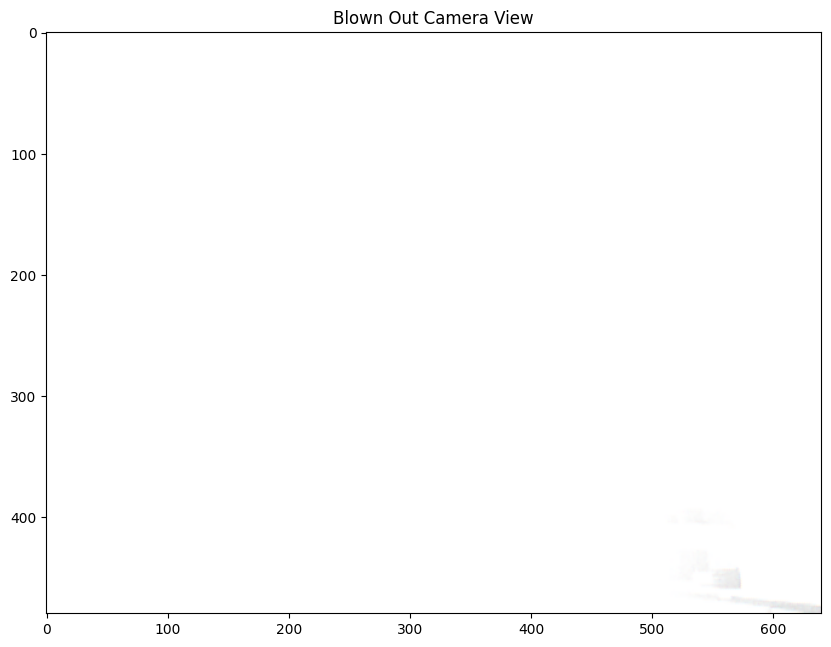

In [ ]:
blown_out_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/blown_ou2.png')

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.imshow(blown_out_arr)
ax1.set_title('Blown Out Camera View')

plt.show()

In [ ]:
print(f"min: {blown_out_arr.min()}, max: {blown_out_arr.max()}")

min: 214, max: 255


new min: 0, new max: 255


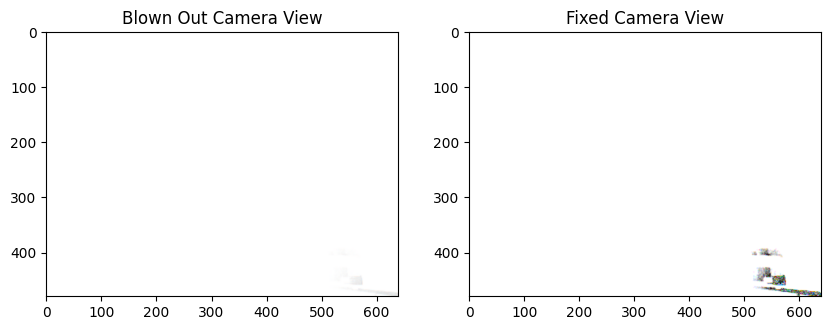

In [ ]:
import numpy as np

def normalize_image(image):
    """
    Normalize the image so that the minimum pixel value maps to 0 and the maximum pixel value maps to 255.

    Parameters:
    image : numpy.ndarray
        The input image array in RGB or grayscale format.

    Returns:
    numpy.ndarray
        The normalized image.
    """
    # Convert image to float type for accurate calculation
    image = image.astype(np.float32)

    # Find the minimum and maximum pixel values in the image
    min_val = 245
    max_val = image.max()

    # Normalize the image to scale pixel values to range [0, 255]
    if max_val - min_val != 0:
        image = 255 * (image - min_val) / (max_val - min_val)
    else:
        image = np.zeros(image.shape, dtype=np.uint8)  # Handle case where the image is flat

    # Convert the image back to uint8
    return image.astype(np.uint8)

adjusted_view = normalize_image(blown_out_arr)

print(f'new min: {adjusted_view.min()}, new max: {adjusted_view.max()}')

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(blown_out_arr)
ax1.set_title('Blown Out Camera View')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(adjusted_view)
ax2.set_title('Fixed Camera View')

plt.show()

# Fine Tuning

In [ ]:
!pip install imageio
import base64
import io
from dataclasses import dataclass
from io import BytesIO
from PIL import Image
from matplotlib import pyplot as plt
import imageio
import numpy as np
import zlib
import pickle

In [ ]:
# Decode the base64 string to bytes
compressed_array = base64.b64decode(enc_raw_data)

# Decompress the zlib data
serialized_array = zlib.decompress(compressed_array)

# Deserialize the pickle data
raw_depth_arr = pickle.loads(serialized_array)

# save numpy array
np.save('/content/drive/MyDrive/Colab Notebooks/real/4/depth.npy', raw_depth_arr)

NameError: name 'enc_raw_data' is not defined

<ipython-input-53-43e19abfebbe>:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  camera_img_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/3/cam3.png')
<ipython-input-53-43e19abfebbe>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  depth_img_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/3/depth3.png')


shape=(480, 640), min=0.288, max=2.047
[[2.047 2.047 2.047 ... 2.047 2.047 2.047]
 [2.047 2.047 2.047 ... 2.047 2.047 2.047]
 [2.047 2.047 2.047 ... 2.047 2.047 2.047]
 ...
 [2.047 2.047 2.047 ... 2.047 2.047 2.047]
 [2.047 2.047 2.047 ... 2.047 2.047 2.047]
 [2.047 2.047 2.047 ... 2.047 2.047 2.047]]


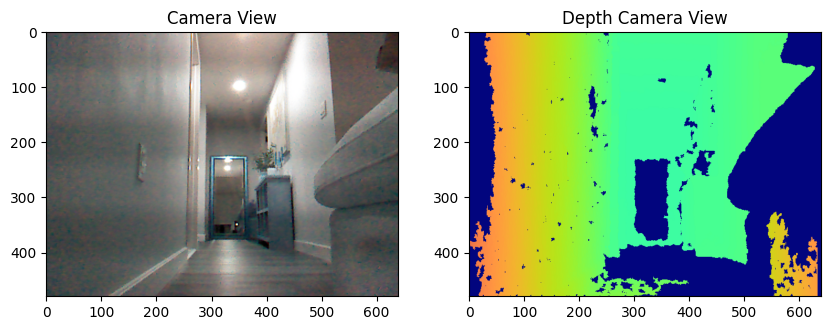

In [ ]:
def base64_to_arr(enc_img):
  base64_decoded = base64.b64decode(enc_img)

  image = Image.open(io.BytesIO(base64_decoded))
  return np.array(image)

camera_img_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/3/cam3.png')
depth_img_arr = imageio.imread('/content/drive/MyDrive/Colab Notebooks/real/3/depth3.png')
depth_raw_arr = np.load('/content/drive/MyDrive/Colab Notebooks/real/3/depth.npy')

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(camera_img_arr)
ax1.set_title('Camera View')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(depth_img_arr)
ax2.set_title('Depth Camera View')

print(f'shape={depth_raw_arr.shape}, min={depth_raw_arr.min()}, max={depth_raw_arr.max()}')
print(depth_raw_arr)

plt.show()

# Find The Passageways

In [ ]:
@dataclass
class LabelPassagewaysConfig:
  # used to control what part of the depth image should be average to compute a passageway
  top_clip_percent: float = 0.5
  bottom_clip_percent: float = 0.9

  # average distance to be considered a path forward
  passage_distance_threshold: float = 1

  # minimum width of a passage for robot to consider passing through it
  min_passage_width: int = 30

  # control where X labeling passages is placed vertically on the final image
  x_height_percent: float = 0.65

config = LabelPassagewaysConfig()

<ipython-input-55-1ec990b9b9b7>:16: RuntimeWarning: invalid value encountered in divide
  row_avgs = np.where(non_zero_count != 0, col_sums / non_zero_count, 0)


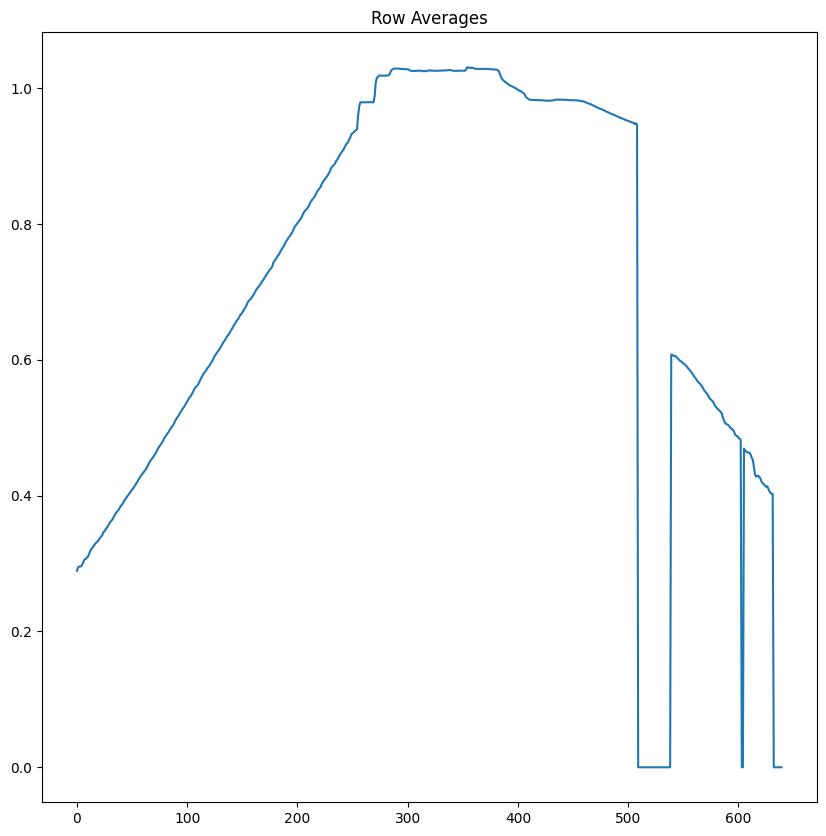

In [ ]:
# clip depth averaging to only scan bottom of the image
image_height = depth_raw_arr.shape[0]
image_width = depth_raw_arr.shape[1]
top_percent = config.top_clip_percent
bottom_percent = config.bottom_clip_percent
depth_image_arr_clipped = depth_raw_arr[int(image_height * top_percent):int(image_height * bottom_percent), :]

# Count non-zero elements in each column
depth_image_arr_clipped[depth_image_arr_clipped == 2.047] = 0
non_zero_count = np.count_nonzero(depth_image_arr_clipped, axis=0)

# Sum of elements in each column
col_sums = np.sum(depth_image_arr_clipped, axis=0)

# Calculate averages, avoiding division by zero
row_avgs = np.where(non_zero_count != 0, col_sums / non_zero_count, 0)

# find sections where robot can walk
threshold = config.passage_distance_threshold
sections = []
centers_horz = []

### Used to compute weighted average in each section which will be the location of the x

# x_0 * avg_0 + x_1 * avg_1 + ...
weighted_loc_sum = 0

# avg_0 + avg_1 + ...
weight_sum = 0

in_section = False

fig = plt.figure(figsize=(10,10))
ax2 = fig.add_subplot(1,1,1)
ax2.plot(row_avgs)
ax2.set_title('Row Averages')

plt.show()

<ipython-input-56-d268891d97ed>:1: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


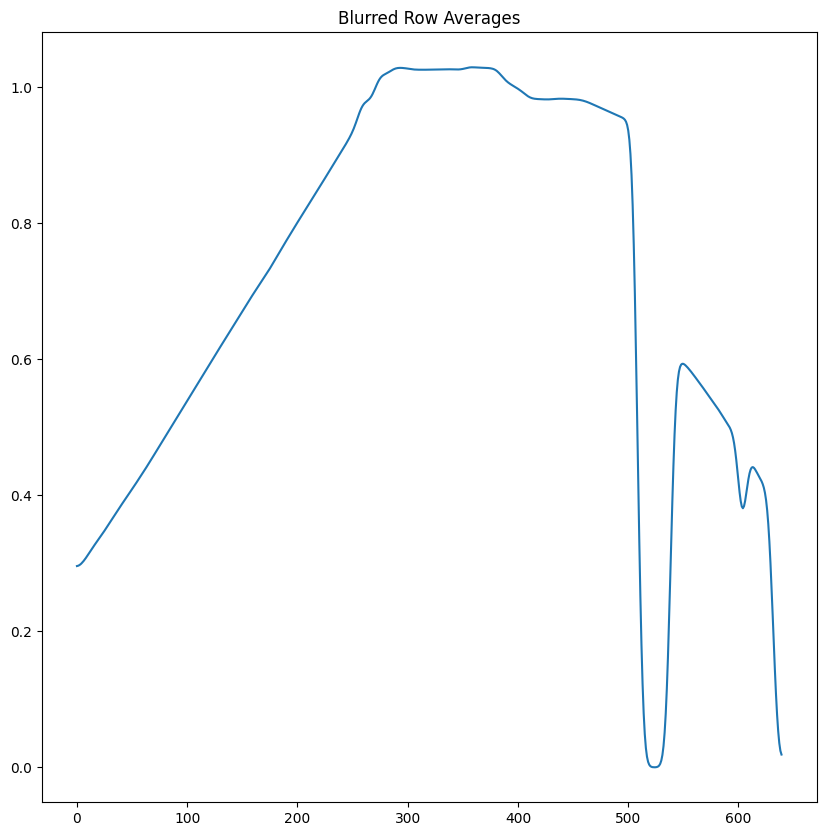

In [ ]:
from scipy.ndimage.filters import gaussian_filter

def convolve_1d(signal, kernel):
    kernel = kernel[::-1]
    return [
        np.dot(
            signal[max(0,i):min(i+len(kernel),len(signal))],
            kernel[max(-i,0):len(signal)-i*(len(signal)-len(kernel)<i)],
        )
        for i in range(1-len(kernel),len(signal))
    ]

def gaussian_kernel(size, sigma=1):
    """
    Generate a 1D Gaussian kernel.

    Parameters:
        size (int): the size of the kernel (number of elements).
        sigma (float): the standard deviation of the Gaussian distribution.

    Returns:
        numpy.ndarray: a 1D array representing the Gaussian kernel.
    """
    # Ensure the size is odd to have a central element
    if size % 2 == 0:
        size += 1

    # Generate an array with the appropriate range
    x = np.linspace(-(size // 2), size // 2, size)

    # Compute the Gaussian function
    kernel = np.exp(-0.5 * (x / sigma) ** 2)
    kernel /= np.sum(kernel)  # Normalize the kernel

    return kernel

row_avgs_blured = gaussian_filter(row_avgs, sigma=4)
fig = plt.figure(figsize=(10,10))
ax2 = fig.add_subplot(1,1,1)
ax2.plot(row_avgs_blured)
ax2.set_title('Blurred Row Averages')

plt.show()

In [ ]:
for k in range(row_avgs_blured.shape[0]):
  avg = row_avgs_blured[k]
  if avg > threshold:
    weighted_loc_sum += k * avg
    weight_sum += avg
    if in_section:
      sections[-1][1] = k
      centers_horz[-1] = weighted_loc_sum / weight_sum
    else:
      sections.append([k, -1])
      centers_horz.append(k)
      in_section = True
  else:
    in_section = False
    weighted_loc_sum = 0
    weight_sum = 0

# If final section includes end of the image, close the section
if len(sections) > 0 and sections[-1][1] == -1:
  sections[-1][1] = row_avgs_blured.shape[0] - 1

sections

[[271, 397]]

In [ ]:
# filter out passages to small to passthrough
min_passage_width = config.min_passage_width
def passage_valid(section: list[int]) -> bool:
  if section[1] - section[0] < min_passage_width:
    print(f'Filtering out passageway for being to narrow width={section[1] - section[0]}, {min_passage_width=}')
    return False

  return True

def filter_close_values(values, min_distance):
    """
    Filter out values from a list of floats that are too close together.

    Parameters:
        values (list of float): The list of floating-point numbers to filter.
        min_distance (float): The minimum allowed distance between any two values.

    Returns:
        list of float: A list of filtered values with minimum specified distance.
    """
    if not values:
        return []

    # Sort the values to make it easier to compare adjacent values
    sorted_values = sorted(values)

    # Initialize the filtered list with the first value
    filtered_values = [sorted_values[0]]

    # Go through the sorted values and add a value only if it's far enough from the last added value
    for value in sorted_values[1:]:
        if value - filtered_values[-1] >= min_distance:
            filtered_values.append(value)
        else:
            print(f'discarding passageway with horz_loc={value} since it is to close to another center')

    return filtered_values

centers_horz = [center for i, center in enumerate(centers_horz) if passage_valid(sections[i])]
centers_horz = filter_close_values(centers_horz, 10)

centers_horz

[333.9645217991744]

[PhysicalPassagewayInfo(color='red', turn_degrees=0.7636847858923496)]


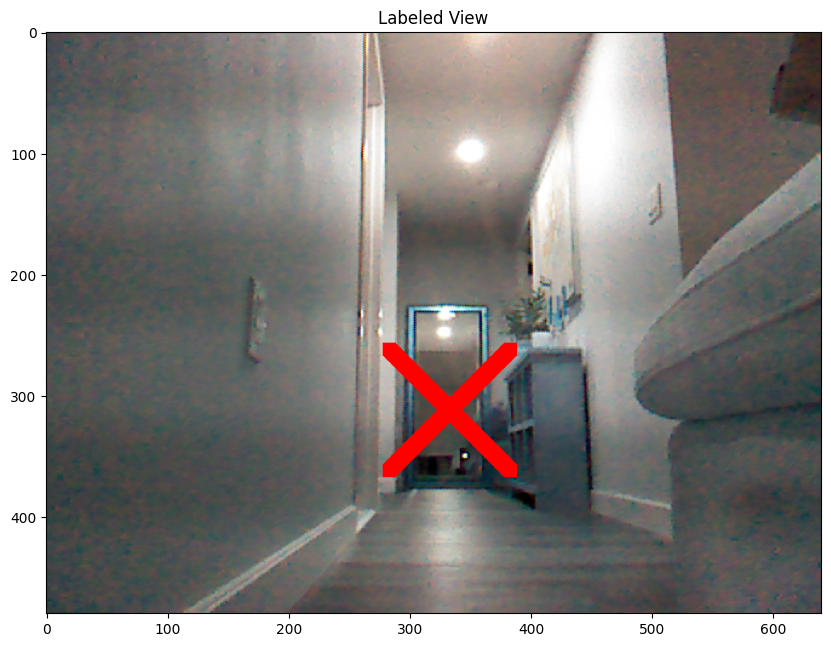

In [ ]:
x_height_percent = config.x_height_percent
centers = [
  (cx, x_height_percent * image_height)
  for cx in centers_horz
]

def draw_line(img, start, end, color, thickness):
  """Draw a line on an image using Bresenham's algorithm."""
  x0, y0 = start
  x1, y1 = end
  dx = abs(x1 - x0)
  dy = -abs(y1 - y0)
  sx = 1 if x0 < x1 else -1
  sy = 1 if y0 < y1 else -1
  err = dx + dy

  while True:
    for t in range(-thickness // 2, thickness // 2 + 1):
      for u in range(-thickness // 2, thickness // 2 + 1):
        if 0 <= x0 + u < img.shape[1] and 0 <= y0 + t < img.shape[0]:
          img[int(y0 + t), int(x0 + u)] = np.array(color)
    if x0 == x1 and y0 == y1:
      break
    e2 = 2 * err
    if e2 >= dy:
      err += dy
      x0 += sx
    if e2 <= dx:
      err += dx
      y0 += sy

def draw_x(img, center, size, thickness, color):
  """Draw an X at a specific location on the image."""
  cx, cy = center
  half_size = size // 2

  # Calculate end points for both lines of the X
  start1 = (cx - half_size, cy - half_size)
  end1 = (cx + half_size, cy + half_size)
  start2 = (cx - half_size, cy + half_size)
  end2 = (cx + half_size, cy - half_size)

  # Draw both lines
  draw_line(img, start1, end1, color, thickness)
  draw_line(img, start2, end2, color, thickness)

@dataclass
class PhysicalPassagewayInfo:
  color: str
  turn_degrees: float

colors = [
  ("red", (255, 0, 0)),
  ("green", (0, 255, 0)),
  ("blue", (0, 0, 255)),
  ("yellow", (255, 255, 0)),
  ("cyan", (0, 255, 255)),
  ("magenta", (255, 0, 255)),
  ("orange", (255, 165, 0)),
  ("purple", (128, 0, 128)),
  ("pink", (255, 192, 203)),
  ("brown", (165, 42, 42)),
  ("gray", (128, 128, 128)),
  ("black", (0, 0, 0)),
  ("white", (255, 255, 255)),
]
labeled_img = np.copy(camera_img_arr)
xs_info = []
for i, center in enumerate(centers):
  draw_x(labeled_img, center, size=100, thickness=10, color=colors[i][1])

  # compute degrees to turn to face this
  degrees = (70 / 2) * (center[0] / image_width - 0.5)

  xs_info.append(PhysicalPassagewayInfo(
    turn_degrees=degrees,
    color=colors[i][0]
  ))

print(xs_info)

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.imshow(labeled_img)
ax1.set_title('Labeled View')

plt.show()

# Missing data

avg_non_zero_depth=4.925432812434201e-05 shape=(480, 640), min=0.0, max=2.114


Text(0.5, 1.0, 'Preprocessed Depth View')

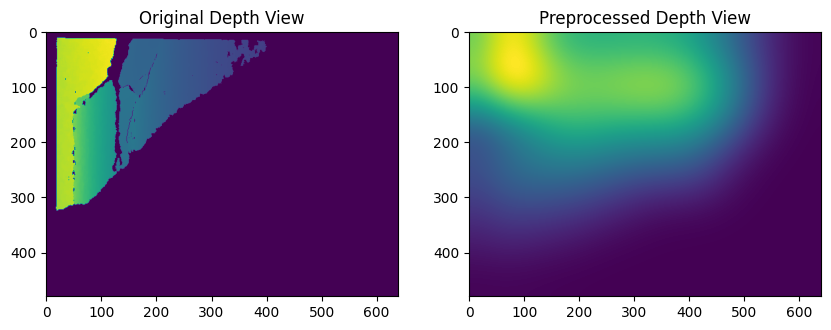

In [68]:
import base64
import pickle
import zlib
from scipy.ndimage import gaussian_filter

with open('/content/drive/MyDrive/GPTPet/missing_data_raw', 'r') as f:
  enc_raw_data = f.read()

# Decode the base64 string to bytes
compressed_array = base64.b64decode(enc_raw_data)

# Decompress the zlib data
serialized_array = zlib.decompress(compressed_array)

# Deserialize the pickle data
depth_raw_arr = pickle.loads(serialized_array)


def depth_arr_avg(depth_raw_arr: np.array):
  blurred_depth_arr = gaussian_filter(depth_raw_arr, sigma=75)

  non_zero_count = np.count_nonzero(blurred_depth_arr, axis=0)\
    .astype(float)[25:-25]

  # Sum of elements in each column
  col_sums = np.sum(blurred_depth_arr, axis=0).astype(float)\
    [25:-25]

  # Calculate averages, avoiding division by zero
  row_avgs = np.where(non_zero_count != 0, col_sums / non_zero_count, 0)
  # print(row_avgs)

  return min(row_avgs)

avg_non_zero_depth = depth_arr_avg(depth_raw_arr)

print(f'avg_non_zero_depth={avg_non_zero_depth} shape={depth_raw_arr.shape}, min={depth_raw_arr.min()}, max={depth_raw_arr.max()}')

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(depth_raw_arr)
ax1.set_title('Original Depth View')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(blurred_depth_arr)
ax2.set_title('Preprocessed Depth View')

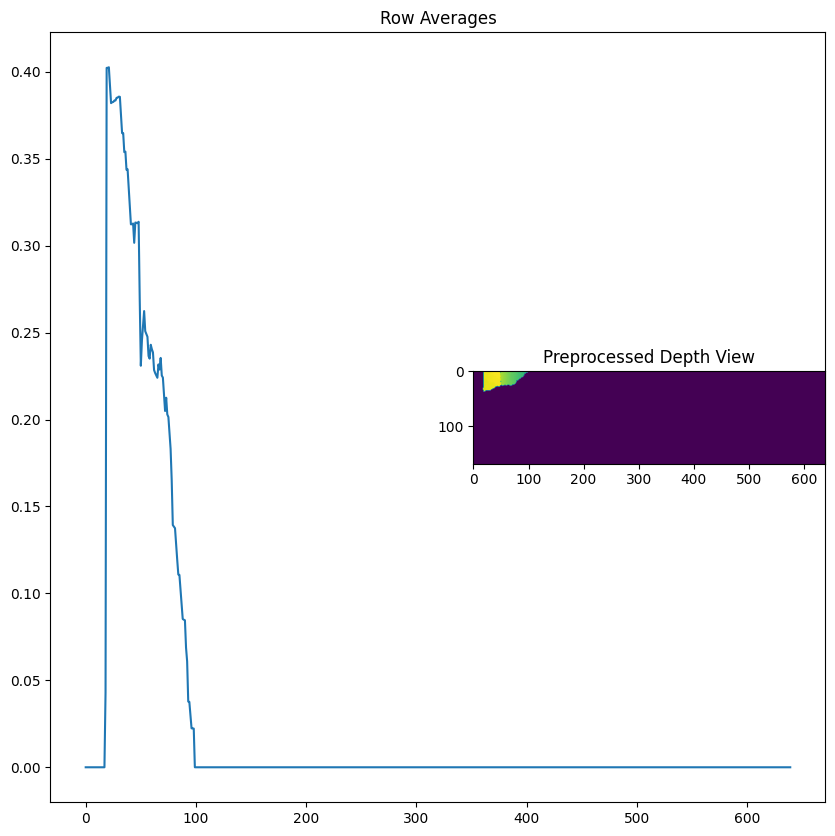

In [71]:
from dataclasses import dataclass
import numpy as np
import matplotlib.pyplot as plt

@dataclass
class LabelPassagewaysConfig:
  # used to control what part of the depth image should be average to compute a passageway
  top_clip_percent: float = 0.6
  bottom_clip_percent: float = 0.95

  # average distance to be considered a path forward
  passage_distance_threshold: float = 0.5

  # minimum width of a passage for robot to consider passing through it
  min_passage_width: int = 30

  # control where X labeling passages is placed vertically on the final image
  x_height_percent: float = 0.65

  # std deviation for col averages gaussian blurring
  sigma: float = 4.

config = LabelPassagewaysConfig()

# clip depth averaging to only scan bottom of the image
image_height = depth_raw_arr.shape[0]
image_width = depth_raw_arr.shape[1]
top_percent = config.top_clip_percent
bottom_percent = config.bottom_clip_percent
depth_image_arr_clipped = depth_raw_arr[int(image_height * top_percent):int(image_height * bottom_percent), :]

# Count non-zero elements in each column
depth_image_arr_clipped[depth_image_arr_clipped == 2.047] = 0


# non_zero_count = np.count_nonzero(depth_image_arr_clipped, axis=0)
# col_sums = np.sum(depth_image_arr_clipped, axis=0)
# row_avgs = np.where(non_zero_count != 0, col_sums / non_zero_count, 0)

clipped_height = (bottom_percent - top_percent) * image_height
col_sums = np.sum(depth_image_arr_clipped, axis=0)
row_avgs = col_sums / clipped_height

# find sections where robot can walk
threshold = config.passage_distance_threshold
sections = []
centers_horz = []

### Used to compute weighted average in each section which will be the location of the x

# x_0 * avg_0 + x_1 * avg_1 + ...
weighted_loc_sum = 0

# avg_0 + avg_1 + ...
weight_sum = 0

in_section = False

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1,1,1)
ax1.plot(row_avgs)
ax1.set_title('Row Averages')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(
    depth_raw_arr[int(image_height * top_percent):int(image_height * bottom_percent), :]
)
ax2.set_title('Preprocessed Depth View')

plt.show()

In [70]:
row_avgs_blurred = gaussian_filter(row_avgs, sigma=config.sigma)
for k in range(row_avgs_blurred.shape[0]):
  avg = row_avgs_blurred[k]
  if avg > threshold:
    weighted_loc_sum += k * avg
    weight_sum += avg
    if in_section:
      sections[-1][1] = k
      centers_horz[-1] = weighted_loc_sum / weight_sum
    else:
      sections.append([k, -1])
      centers_horz.append(k)
      in_section = True
  else:
    in_section = False
    weighted_loc_sum = 0
    weight_sum = 0

# If final section includes end of the image, close the section
if len(sections) > 0 and sections[-1][1] == -1:
  sections[-1][1] = row_avgs_blurred.shape[0] - 1

# filter out passages to small to passthrough
min_passage_width = config.min_passage_width

def passage_valid(section: list[int]) -> bool:
  if section[1] - section[0] < min_passage_width:
    print(f'Filtering out passageway for being to narrow width={section[1] - section[0]}, {min_passage_width=}')
    return False

  return True

def filter_close_values(values, min_distance):
  """
  Filter out values from a list of floats that are too close together.

  Parameters:
      values (list of float): The list of floating-point numbers to filter.
      min_distance (float): The minimum allowed distance between any two values.

  Returns:
      list of float: A list of filtered values with minimum specified distance.
  """
  if not values:
    return []

  # Sort the values to make it easier to compare adjacent values
  sorted_values = sorted(values)

  # Initialize the filtered list with the first value
  filtered_values = [sorted_values[0]]

  # Go through the sorted values and add a value only if it's far enough from the last added value
  for value in sorted_values[1:]:
    if value - filtered_values[-1] >= min_distance:
      filtered_values.append(value)
    else:
      print(f'discarding passageway with horz_loc={value} since it is to close to another center')

  return filtered_values

centers_horz = [center for i, center in enumerate(centers_horz) if passage_valid(sections[i])]
centers_horz = filter_close_values(centers_horz, 10.)

# draw x to label each passageway
x_height_percent = config.x_height_percent
centers = [
  (cx, x_height_percent * image_height)
  for cx in centers_horz
]

centers

[(43.19676838474274, 312.0)]